In [1]:
%matplotlib inline
from matplotlib import pyplot as plt

import tensorflow as tf
from training import get_labels_from_annotation_batch
slim = tf.contrib.slim
from scipy.misc import imread
import numpy as np
from tensorflow.python.ops import control_flow_ops
import os

In [2]:
# Use second GPU -- change if you want to use a first one
os.environ["CUDA_VISIBLE_DEVICES"] = '0'
version="v3"

In [3]:
#0:   background
#1:   roads
#2:   buildings
#255: undefined/don't care
number_of_classes = 3
class_labels = [v for v in range((number_of_classes+1))]
class_labels[-1] = 255
print(class_labels)

[0, 1, 2, 255]


In [4]:
def model_input():
    # Create and return the placeholders for receiving data
    batch_images_placeholder = tf.placeholder(tf.float32, shape=[None, 256, 256, 3])
    batch_labels_placeholder = tf.placeholder(tf.uint8, shape=[None, None, None])
    is_training_placeholder = tf.placeholder(tf.bool, name="is_training_placeholder")
    keep_prob = tf.placeholder(tf.float32, name="dropout_keep_probability")
    return batch_images_placeholder, batch_labels_placeholder, is_training_placeholder, keep_prob

In [5]:
@slim.add_arg_scope
def block_unit(net, k, id, keep_prob=1.0, rate=1):
    # block_unit implements a bottleneck layer 
    with tf.variable_scope("block_unit_" + str(id)):
        
        net = slim.batch_norm(net, activation_fn=tf.nn.relu)
        
        # each 1×1 convolution produce 4k feature-maps
        net = slim.conv2d(net, 4*k, [1,1], scope="conv1", activation_fn=None, normalizer_fn=None)
        net = slim.dropout(net, keep_prob, scope='dropout1')
        net = slim.batch_norm(net, activation_fn=tf.nn.relu)

        net = slim.conv2d(net, k, [3,3], scope="conv3x3", activation_fn=None, normalizer_fn=None, rate=rate)
        net = slim.dropout(net, keep_prob, scope='dropout2')

        return net

In [6]:
@slim.add_arg_scope
def add_transition_layer(net, id, pooling=True, theta=1.0):
    # We use 1×1 convolution followed by 2×2 average pooling as transition layers between two contiguous dense blocks
    with tf.variable_scope("transition_layer_" + str(id)):  
        current_depth = slim.utils.last_dimension(net.get_shape(), min_rank=4)

        net = slim.batch_norm(net, activation_fn=tf.nn.relu)
        net = slim.conv2d(net, theta*current_depth, [1,1], scope='conv1x1', 
                          activation_fn=None, normalizer_fn=None)
        net = slim.dropout(net, keep_prob, scope='dropout')
        if pooling:
            net = slim.avg_pool2d(net, [2,2], scope='avg_pool', stride=2)
        return net

In [7]:
@slim.add_arg_scope
def add_upsampling_layer(net, resize_to, id, theta=0.5):

    with tf.variable_scope("resize_layer_" + str(id)):
        depth = slim.utils.last_dimension(net.get_shape(), min_rank=4)
        net = slim.batch_norm(net, activation_fn=tf.nn.relu)
        
        new_depth = int(theta*depth)
        net = slim.conv2d(net, new_depth, [1,1], scope='conv1x1', 
                          activation_fn=None, normalizer_fn=None)
        net = tf.image.resize_nearest_neighbor(net, resize_to)
        net = slim.conv2d(net, new_depth, [3,3], scope='conv3x3',
                         activation_fn=None, normalizer_fn=None)
        return net

In [8]:
@slim.add_arg_scope
def atrous_pyramid_pooling(net, summary=True):
    with tf.variable_scope("atrous_spatial_pyramid_pooling"):
        depth = slim.utils.last_dimension(net.get_shape(), min_rank=4)
        at_pool1x1 = slim.conv2d(net, depth, [1,1], scope="conv_1x1_0", activation_fn=None)

        at_pool3x3_1 = slim.conv2d(net, depth, [3,3], scope="conv_3x3_1", rate=6, activation_fn=None)

        at_pool3x3_2 = slim.conv2d(net, depth, [3,3], scope="conv_3x3_2", rate=12, activation_fn=None)

        at_pool3x3_3 = slim.conv2d(net, depth, [3,3], scope="conv_3x3_3", rate=18, activation_fn=None)

        net = tf.concat((net, at_pool1x1, at_pool3x3_1, at_pool3x3_2, at_pool3x3_3), axis=3, name="concat")
        net = slim.conv2d(net, depth, [1,1], scope="conv_1x1_output", activation_fn=None)
        if summary:
            tf.summary.image("net", net[:,:,:,:1], 1)
        return net

In [9]:
def add_dense_block(net, k, keep_prob, number_of_units, scope, summary=True):
    number_of_units += 1
    with tf.variable_scope(scope):
        block = block_unit(net, k, 1, keep_prob)
        op_name = "concat_1"

        for i in range(2,number_of_units):
            unit = block_unit(block, k, i, keep_prob)
            op_name += "_" + str(i)
            block = tf.concat((block, unit), axis=3, name=op_name)
        
        if summary:
            tf.summary.image(scope, block[:,:,:,:1], 1)
        return block

Improvements over the Baseline:
    - Implemented Spatial Pyramid pooling layer
    - Reduced the number of units to be half of the network size reported in the DenseNet paper (For imagenet)
    - Changed the rates of the atrous convolutions, I suspect that the 2*i rate was getting very high and thus not bringing any advantages
    - Fixed the learning rate decay steps to 52000

V3:
    - Made the 3rd block to perform atrous convs
    - Implemented multigrid for the two atrous blocks
    - Removed relus from the ASPP layer

In [10]:
def encoder_decoder(batch_images, number_of_classes, k, theta, is_training, keep_prob, batch_norm_decay=0.997, batch_norm_epsilon=1e-5):

    batch_norm_params = {
      'decay': batch_norm_decay,
      'epsilon': batch_norm_epsilon,
      'scale': True,
      'is_training': is_training,
      'updates_collections': tf.GraphKeys.UPDATE_OPS,
    }

    # batch_images shape (?, 224,224,3)
    with slim.arg_scope([slim.conv2d], padding='SAME',
                        weights_initializer=slim.variance_scaling_initializer(),
                        activation_fn=tf.nn.relu,
                        stride=1,
                        normalizer_fn=slim.batch_norm,
                        normalizer_params=batch_norm_params,
                        weights_regularizer=slim.l2_regularizer(0.0001)):

        with slim.arg_scope([slim.batch_norm], **batch_norm_params):

            # We refer to layers between blocks as transition layers, which do convolution and pooling
            net = slim.conv2d(batch_images, 2*k, [7,7], scope='conv1', stride=2) # output stride 2
            #net = slim.max_pool2d(net, [3,3], scope='pool1') # (?,56,56,2*k)
                
            block_1 = add_dense_block(net, k, keep_prob, 3, "dense_block_1")
            net = add_transition_layer(block_1, 1) # output stride 4
            block_2 = add_dense_block(net, k, keep_prob, 6, "dense_block_2")
            net = add_transition_layer(block_2, 2) # output stride 8
            
            multi_grid = [1,1,1,1,2,2,2,2,1,1,1,1]
            rate = 2
            with tf.variable_scope("dense_block_3"):
                block_3 = block_unit(net, k, keep_prob, rate=rate*multi_grid[0])
                op_name = "concat_1"

                for i in range(2,13):
                    unit = block_unit(block_3, k, keep_prob, rate=rate*multi_grid[i-1])
                    op_name += "_" + str(i)
                    block_3 = tf.concat((block_3, unit), axis=3, name=op_name)
                tf.summary.image("block_3", block_3[:,:,:,:1], 1)
            
            net = add_transition_layer(block_3, 3, pooling=False) # output stride 8
            
            #####################################
            # DenseNet based Decoder
            #####################################
            
            block_2_shape = tf.shape(block_2)
            new_size = (block_2_shape[1], block_2_shape[2])
            net = add_upsampling_layer(net, resize_to=new_size, id=1)  # output stride 4
            
            # Define multigrid and rate for atrous conv block. The rate for the inner convolutions is the multiplication
            # of the rate * multi_grid index
            multi_grid = [1,1,1,2,2,2,4,4,4]
            rate = 4
            with tf.variable_scope("dense_block_4"):
                atrous_b_1 = block_unit(net, k, 1, keep_prob, rate=rate=rate*multi_grid[0])
                op_name = "concat_1"
                rates = [2,2,4,4,4,8,8]
                for i in range(2,10):
                    unit = block_unit(atrous_b_1, k, i, keep_prob, rate=rate*multi_grid[i-1])
                    op_name += "_" + str(i)
                    atrous_b_1 = tf.concat((atrous_b_1, unit), axis=3, name=op_name)
                tf.summary.image("atrous_b_1", atrous_b_1[:,:,:,:1], 1)
            
            ####################################
            ####################################
            
            #net = slim.batch_norm(atrous_b_1, activation_fn=tf.nn.relu)
            net = atrous_pyramid_pooling(atrous_b_1)
            net = slim.conv2d(net, number_of_classes, (3,3), activation_fn=None, normalizer_fn=None)
            
            batch_images_shape = tf.shape(batch_images)
            new_size = (batch_images_shape[1], batch_images_shape[2])
            net = tf.image.resize_images(net, new_size)
            #net = add_upsampling_layer(atrous_b_2, resize_to=new_size, id=3)  # original size
            
            tf.summary.image("output", net[:,:,:,:1], 1)
            return net

In [11]:
def model_loss(logits, labels, class_labels):
    "Returns the cross entropy mean to be minimized, the predictions for each pixel and the probabilities."
    annotation_mask = get_labels_from_annotation_batch(labels, class_labels)

    cross_entropies = tf.nn.softmax_cross_entropy_with_logits(logits=logits,
                                                              labels=annotation_mask)

    cross_entropy_mean = tf.reduce_mean(cross_entropies)
    
    # Add summary op for the loss -- to be able to see it in tensorboard.
    tf.summary.scalar('cross_entropy_loss', cross_entropy_mean)

    # Tensor to get the final prediction for each pixel -- pay 
    # attention that we don't need softmax in this case because
    # we only need the final decision. If we also need the respective
    # probabilities we will have to apply softmax.
    pred = tf.argmax(logits, dimension=3)
    probabilities = tf.nn.softmax(logits)
    
    return cross_entropy_mean, pred, probabilities

In [12]:
def read_image_and_annotation(train_images_dir, train_annotations_dir, image_name):
    # read the input and annotation images
    image = imread(train_images_dir + image_name.strip() + ".tiff")
    annotation = imread(train_annotations_dir + image_name.strip() + ".tif")
    #assert (image.dtype) == "uint8"
    #assert (annotation.dtype) == "uint8"
    #image = image - [_R_MEAN, _G_MEAN, _B_MEAN]
    
    image = (image - 128.) / 128.
    
    return image.astype(np.float32), annotation

In [13]:
def random_crop(image_np, annotation_np, crop_size=128):
    """
    image_np: rgb image shape (H,W,3)
    annotation_np: 1D image shape (H,W,1)
    crop_size: integer
    """
    image_h = image_np.shape[0]
    image_w = image_np.shape[1]
    
    random_x = np.random.randint(0, image_w-crop_size+1) # Return random integers from low (inclusive) to high (exclusive).
    random_y = np.random.randint(0, image_h-crop_size+1) # Return random integers from low (inclusive) to high (exclusive).
    
    offset_x = random_x + crop_size
    offset_y = random_y + crop_size
    
    return image_np[random_x:offset_x, random_y:offset_y,:], annotation_np[random_x:offset_x, random_y:offset_y]

In [14]:
def next_batch(train_images_dir, train_annotations_dir, image_filenames_list, crop_image=True, batch_size=5, crop_size=128):
    
    for image_name in image_filenames_list:
        
        image_np, annotation_np = read_image_and_annotation(train_images_dir, train_annotations_dir, image_name)
            
        batch_images = None
        batch_labels = None
        
        for batch_i in range(batch_size):
            cropped_image, cropped_annotation = random_crop(image_np, annotation_np, crop_size)
            cropped_image = np.expand_dims(cropped_image, axis=0)
            cropped_annotation = np.expand_dims(cropped_annotation, axis=0)
            
            if batch_images is None:
                batch_images = cropped_image
                batch_labels = cropped_annotation
            else:
                #print(batch_images.shape, cropped_image.shape)
                batch_images = np.concatenate((batch_images, cropped_image), axis=0)
                batch_labels = np.concatenate((batch_labels, cropped_annotation), axis=0)
    
        yield batch_images, batch_labels

In [15]:
k=12
theta=1.0 # compression_factor
batch_norm_decay = 0.997
batch_norm_epsilon = 1e-5
total_epochs = 500

In [16]:
# get the model placeholders
batch_images_placeholder, batch_labels_placeholder, is_training_placeholder, keep_prob = model_input()

logits = encoder_decoder(batch_images_placeholder, number_of_classes, k, theta, is_training_placeholder, keep_prob)

# get the error and predictions from the network
cross_entropy, pred, probabilities = model_loss(logits, batch_labels_placeholder, class_labels)

In [17]:
# Example: decay from 0.01 to 0.0001 in 10000 steps using sqrt (i.e. power=1. linearly):
global_step = tf.Variable(0, trainable=False)
starter_learning_rate = 0.1
end_learning_rate = 0.001
decay_steps = 52000
learning_rate = tf.train.polynomial_decay(starter_learning_rate, global_step,
                                          decay_steps, end_learning_rate,
                                          power=1)
tf.summary.scalar('learning_rate', learning_rate)

<tf.Tensor 'learning_rate:0' shape=() dtype=string>

In [18]:
with tf.variable_scope("adam_vars"):
    optimizer = tf.train.MomentumOptimizer(learning_rate=learning_rate, momentum=0.9)
    # #optimizer = tf.train.AdamOptimizer(learning_rate=0.01)
    gradients = optimizer.compute_gradients(loss=cross_entropy)

    for grad_var_pair in gradients:

        current_variable = grad_var_pair[1]
        current_gradient = grad_var_pair[0]

        # Relace some characters from the original variable name
        # tensorboard doesn't accept ':' symbol
        gradient_name_to_save = current_variable.name.replace(":", "_")

        # Let's get histogram of gradients for each layer and
        # visualize them later in tensorboard
        tf.summary.histogram(gradient_name_to_save, current_gradient) 

    train_step = slim.learning.create_train_op(cross_entropy, optimizer, global_step=global_step)

In [19]:
update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
if update_ops:
    updates = tf.group(*update_ops)
    cross_entropy = control_flow_ops.with_dependencies([updates], cross_entropy)

In [20]:
# Define the accuracy metric: Mean Intersection Over Union
miou, update_op = slim.metrics.streaming_mean_iou(predictions=pred,
                                                   labels=batch_labels_placeholder,
                                                   num_classes=number_of_classes)

In [21]:
import os
log_folder = '/home/thalles_silva/log_folder'

# Put all summary ops into one op. Produces string when you run it.
process_str_id = str(os.getpid())
merged_summary_op = tf.summary.merge_all()
log_folder = os.path.join(log_folder, process_str_id)
# Create the log folder if doesn't exist yet
if not os.path.exists(log_folder):
    print(log_folder)
    os.makedirs(log_folder)

/home/thalles_silva/log_folder/25953


In [22]:
# define the images and annotations path
base_dataset_dir = "/home/thalles_silva/DataPublic/Road_and_Buildings_detection_dataset/mass_merged"
train_dataset_base_dir = os.path.join(base_dataset_dir, "train")
images_folder_name = "sat/"
annotations_folder_name = "map/"
train_images_dir = os.path.join(train_dataset_base_dir, images_folder_name)
train_annotations_dir = os.path.join(train_dataset_base_dir, annotations_folder_name)

In [23]:
# read the train.txt file. This file contains the training images' names
file = open(os.path.join(train_dataset_base_dir, "train.txt"), 'r')
images_filename_list = [line for line in file]

#images_filename_list = images_filename_list[:4]
number_of_train_examples = len(images_filename_list)
print("number_of_train_examples:", number_of_train_examples)

number_of_train_examples: 104


In [24]:
total_step = total_epochs*number_of_train_examples
print("total_step", total_step)

total_step 52000


In [25]:
# define the images and annotations path
val_dataset_base_dir = os.path.join(base_dataset_dir, "valid")
val_images_dir = os.path.join(val_dataset_base_dir, images_folder_name)
val_annotations_dir = os.path.join(val_dataset_base_dir, annotations_folder_name)

In [26]:
# read the train.txt file. This file contains the training images' names
file = open(os.path.join(val_dataset_base_dir, "val.txt"), 'r')
val_images_filename_list = [line for line in file]

#val_images_filename_list = val_images_filename_list[:2]
print(val_images_filename_list)

['22978945_15\n', '23429155_15\n', '23579050_15\n', '23728930_15\n']


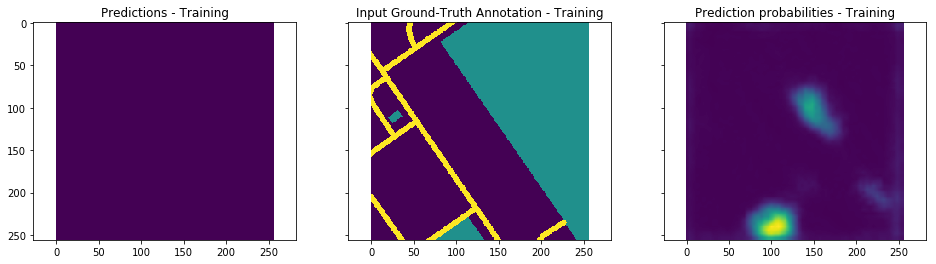

Epoch: 0 	Global step: 104 	Training loss: 0.578346 	Validation Loss: 4104.67 	mIOU: 0.266897 	Learning rate: 0.0998039


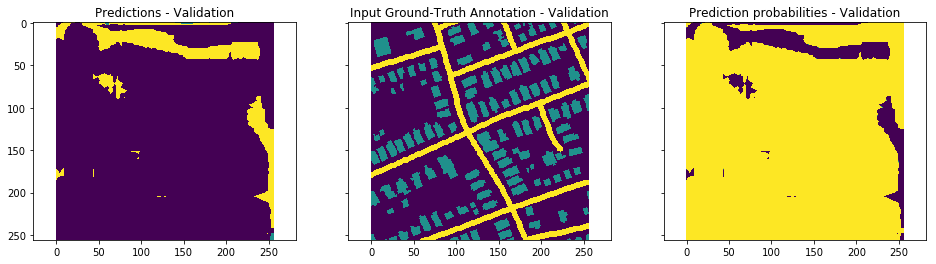

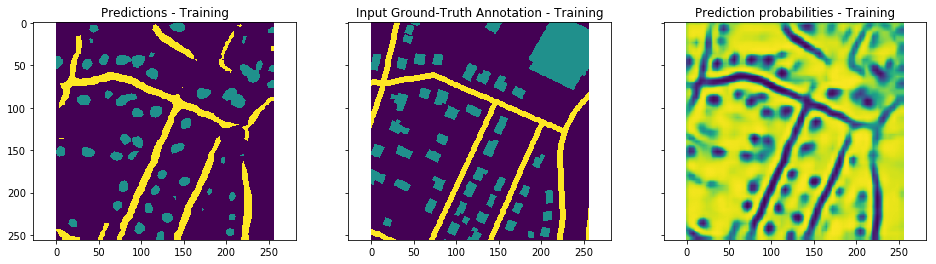

Epoch: 10 	Global step: 1144 	Training loss: 0.477771 	Validation Loss: 0.527558 	mIOU: 0.334994 	Learning rate: 0.0978239


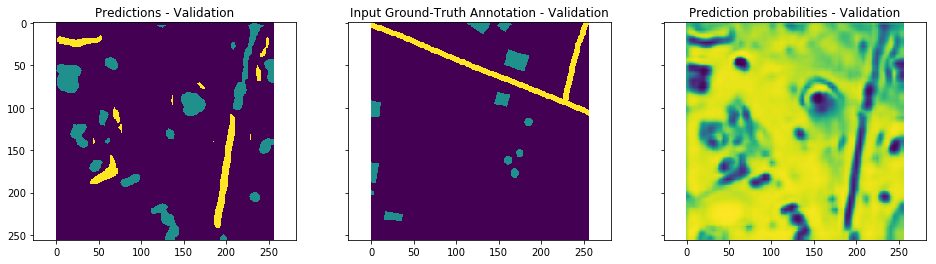

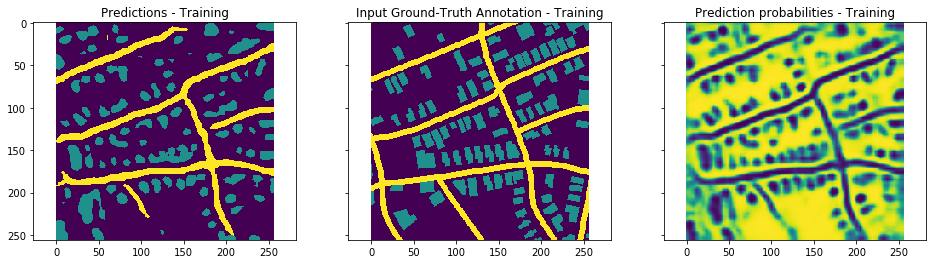

Epoch: 20 	Global step: 2184 	Training loss: 0.634942 	Validation Loss: 0.434066 	mIOU: 0.4202 	Learning rate: 0.0958439


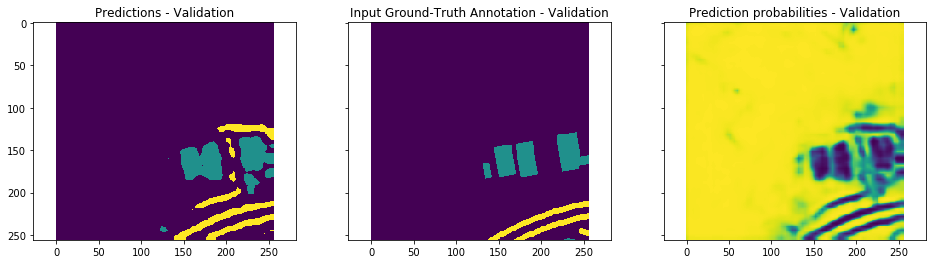

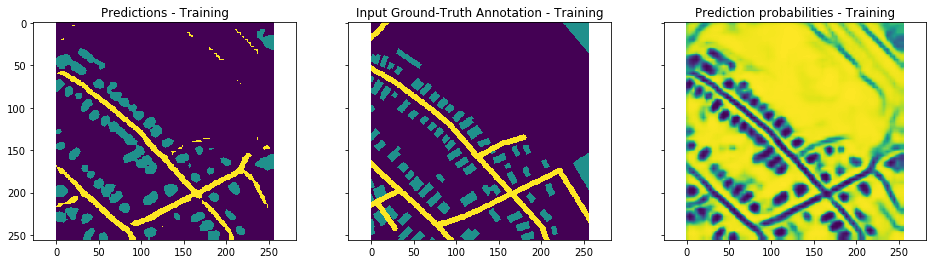

Epoch: 30 	Global step: 3224 	Training loss: 0.311571 	Validation Loss: 0.378813 	mIOU: 0.460363 	Learning rate: 0.0938639


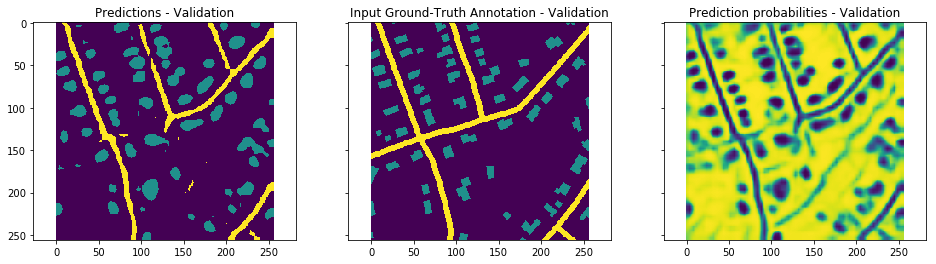

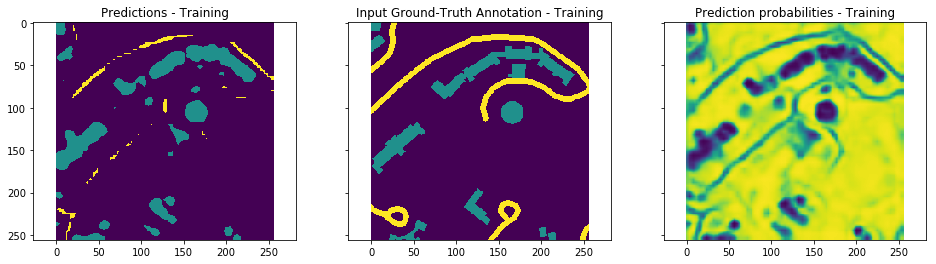

Epoch: 40 	Global step: 4264 	Training loss: 0.295963 	Validation Loss: 0.296143 	mIOU: 0.483814 	Learning rate: 0.0918839


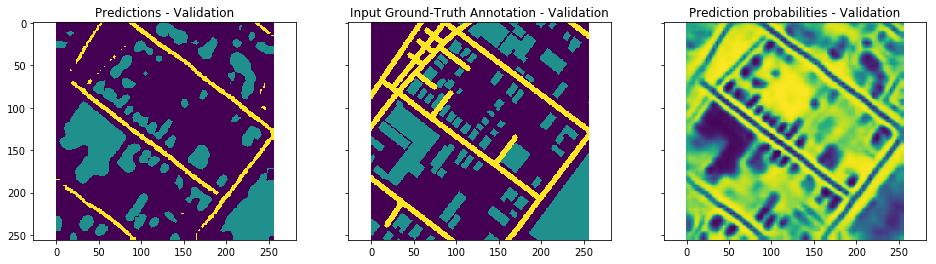

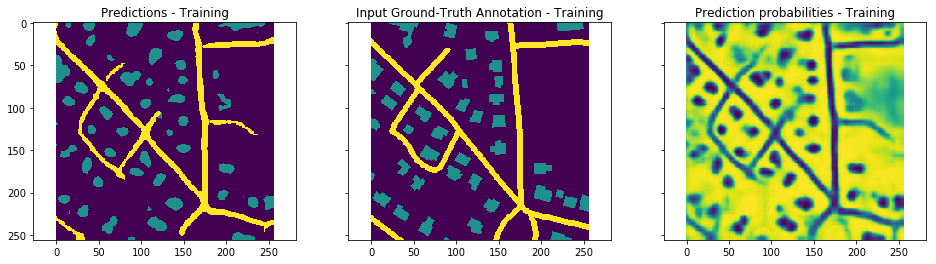

Epoch: 50 	Global step: 5304 	Training loss: 0.439988 	Validation Loss: 0.330636 	mIOU: 0.498617 	Learning rate: 0.0899039


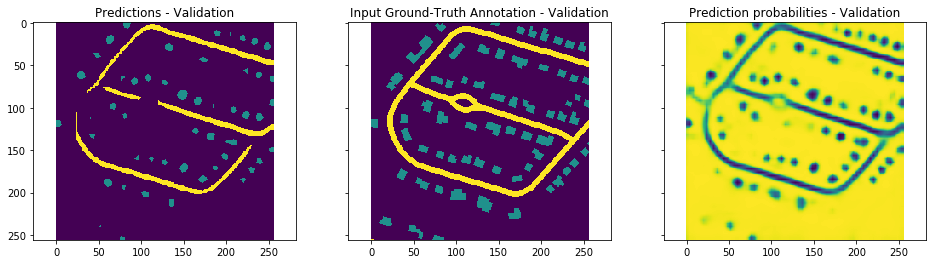

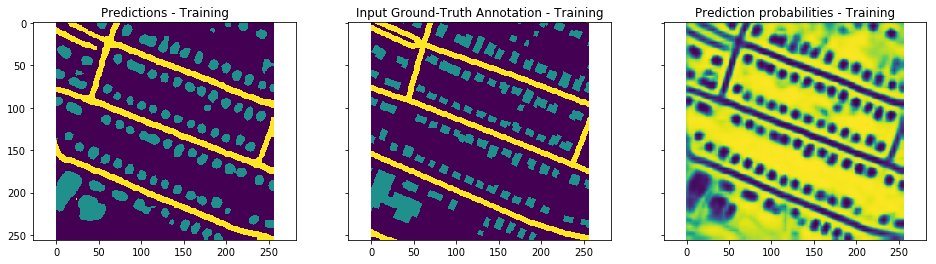

Epoch: 60 	Global step: 6344 	Training loss: 0.345755 	Validation Loss: 0.278129 	mIOU: 0.513561 	Learning rate: 0.0879239


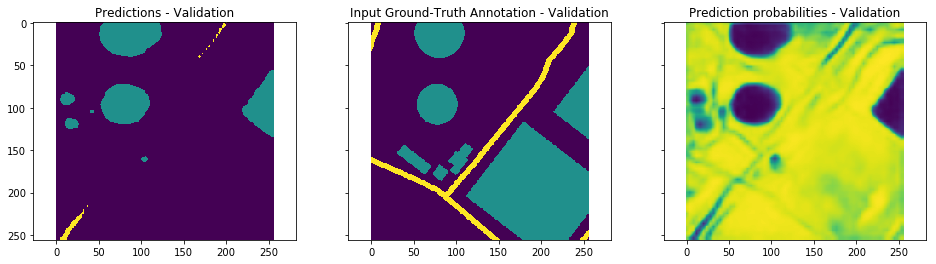

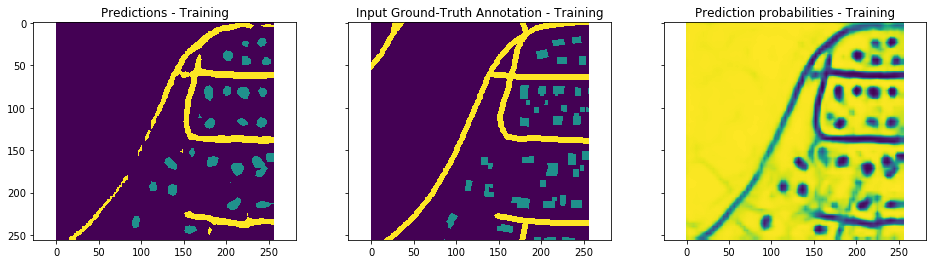

Epoch: 70 	Global step: 7384 	Training loss: 0.288881 	Validation Loss: 0.284422 	mIOU: 0.525811 	Learning rate: 0.0859439


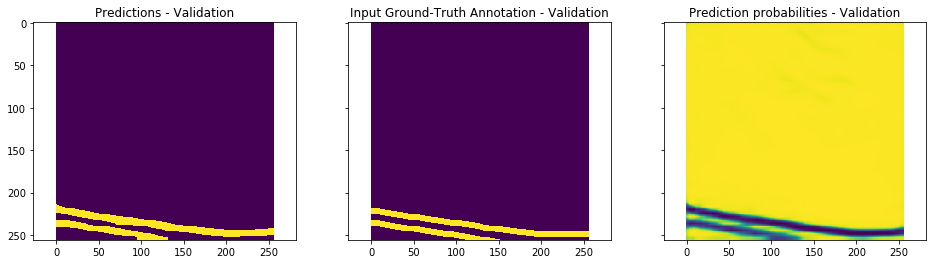

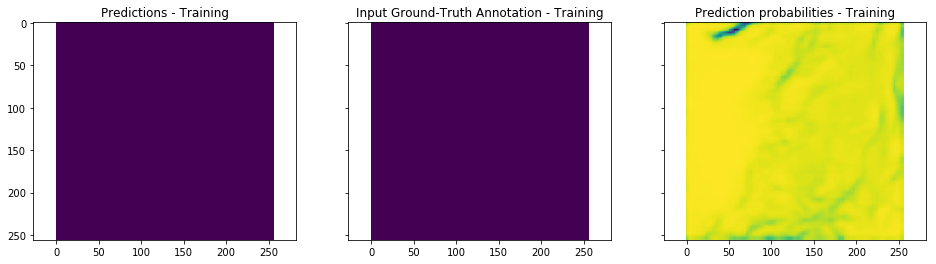

Epoch: 80 	Global step: 8424 	Training loss: 0.107144 	Validation Loss: 0.266197 	mIOU: 0.533291 	Learning rate: 0.0839639


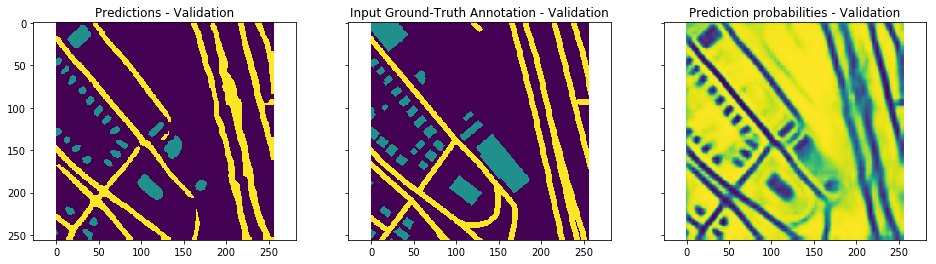

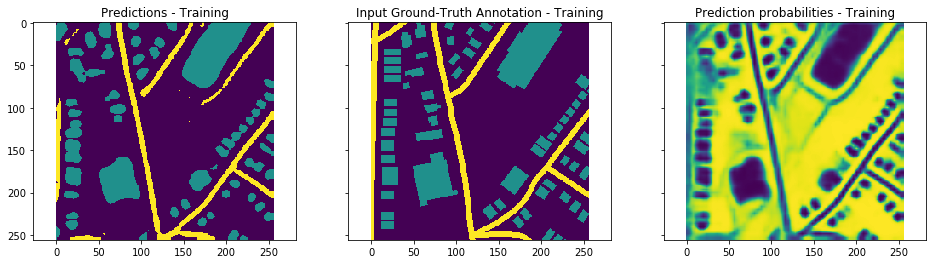

Epoch: 90 	Global step: 9464 	Training loss: 0.250864 	Validation Loss: 0.234501 	mIOU: 0.542335 	Learning rate: 0.0819839


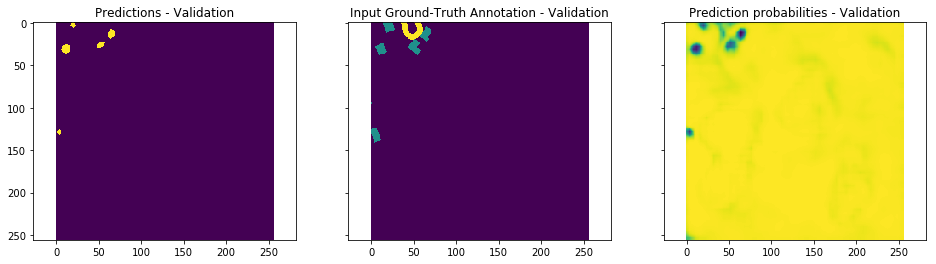

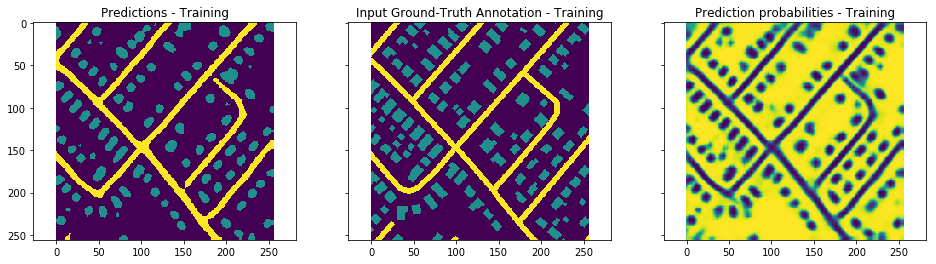

Epoch: 100 	Global step: 10504 	Training loss: 0.263621 	Validation Loss: 0.259614 	mIOU: 0.552956 	Learning rate: 0.0800039


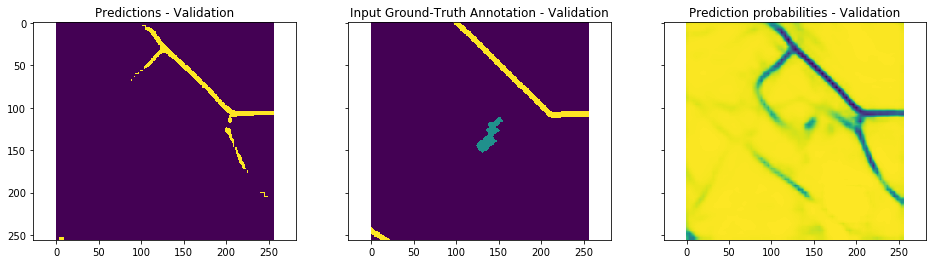

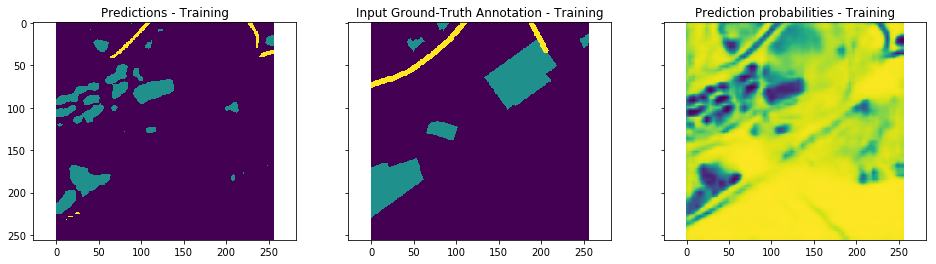

Epoch: 110 	Global step: 11544 	Training loss: 0.255189 	Validation Loss: 0.311699 	mIOU: 0.55656 	Learning rate: 0.0780239


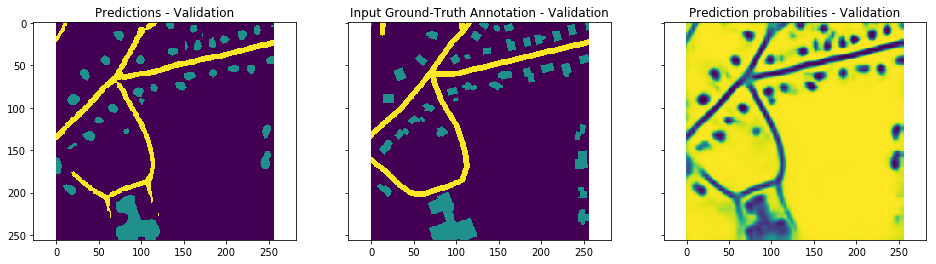

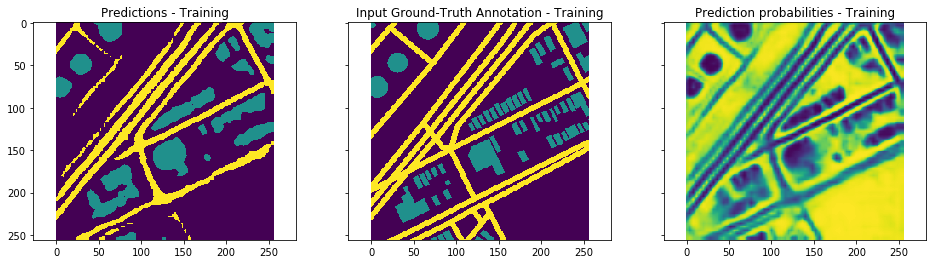

Epoch: 120 	Global step: 12584 	Training loss: 0.370101 	Validation Loss: 0.268989 	mIOU: 0.5663 	Learning rate: 0.0760439


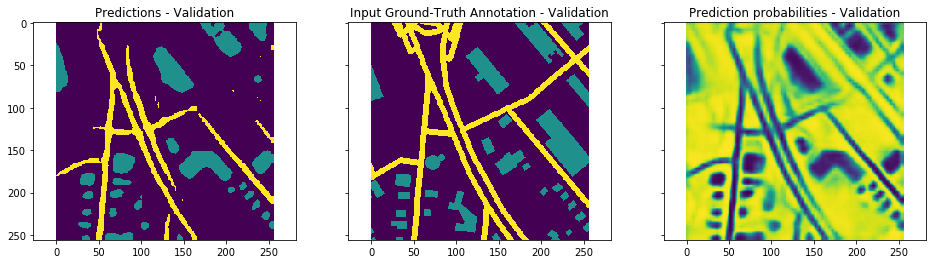

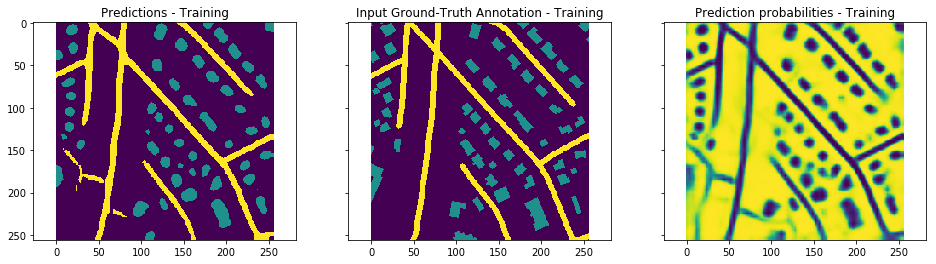

Epoch: 130 	Global step: 13624 	Training loss: 0.249004 	Validation Loss: 0.252488 	mIOU: 0.573011 	Learning rate: 0.0740639


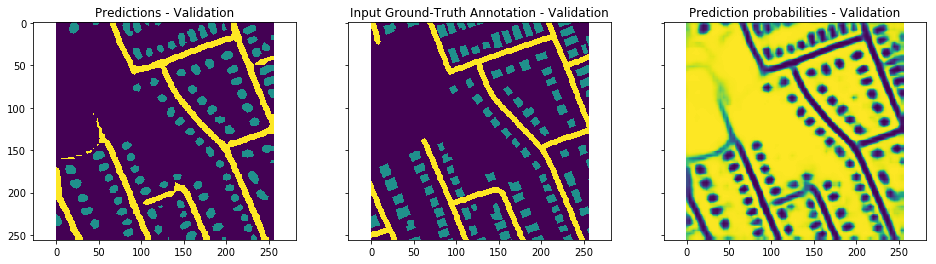

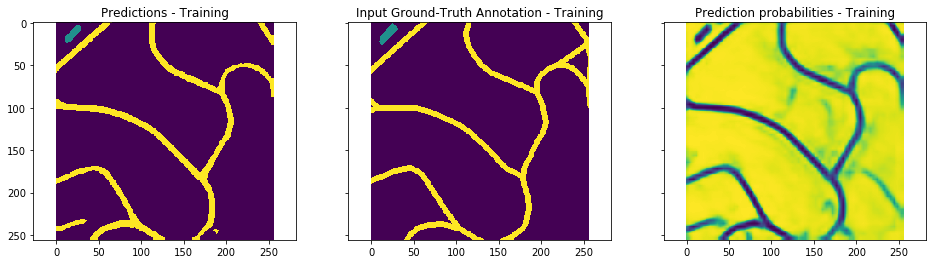

Epoch: 140 	Global step: 14664 	Training loss: 0.173626 	Validation Loss: 0.326411 	mIOU: 0.578917 	Learning rate: 0.0720839


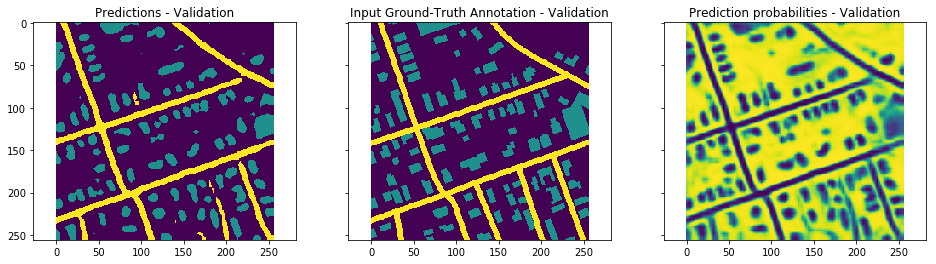

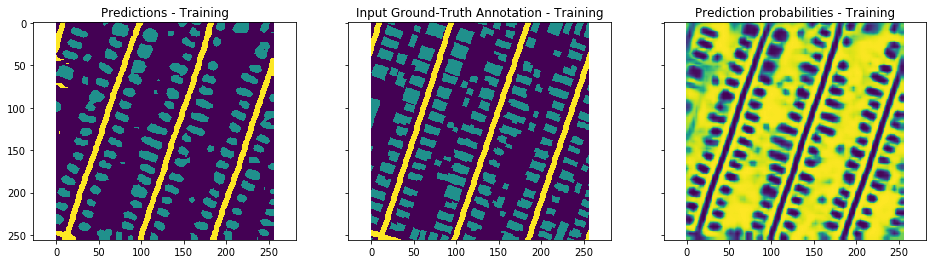

Epoch: 150 	Global step: 15704 	Training loss: 0.354839 	Validation Loss: 0.263625 	mIOU: 0.58387 	Learning rate: 0.0701039


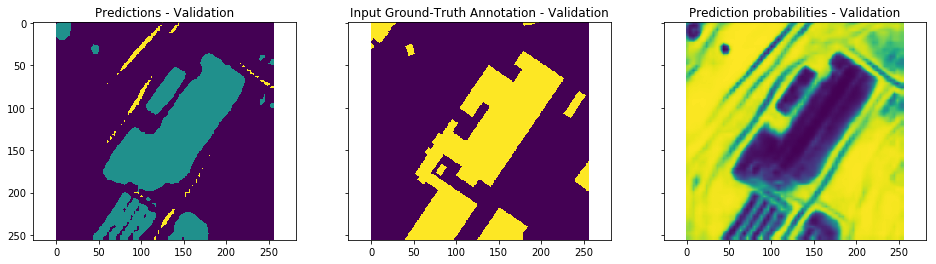

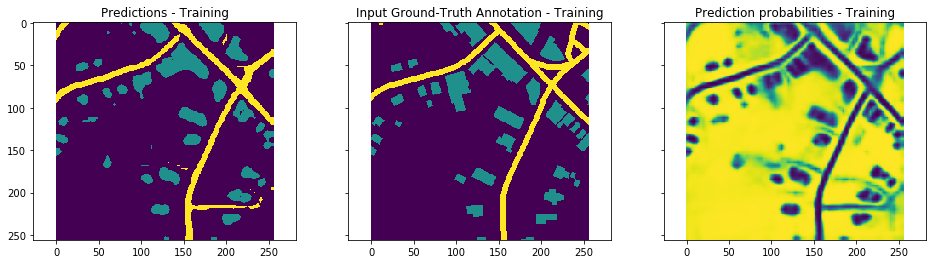

Epoch: 160 	Global step: 16744 	Training loss: 0.243471 	Validation Loss: 0.275259 	mIOU: 0.587201 	Learning rate: 0.0681239


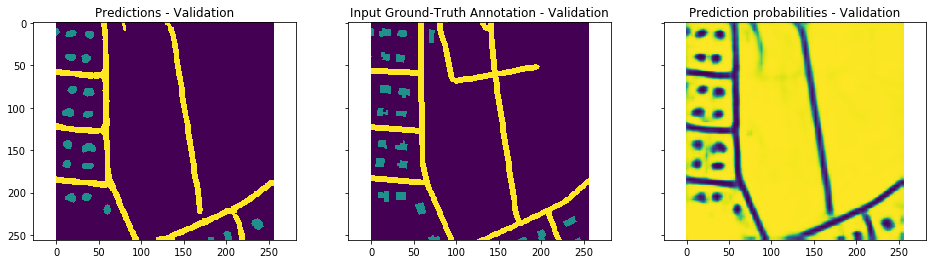

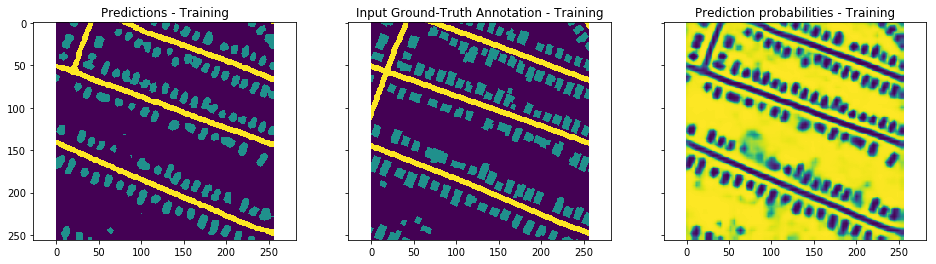

Epoch: 170 	Global step: 17784 	Training loss: 0.313914 	Validation Loss: 0.251553 	mIOU: 0.593913 	Learning rate: 0.0661439


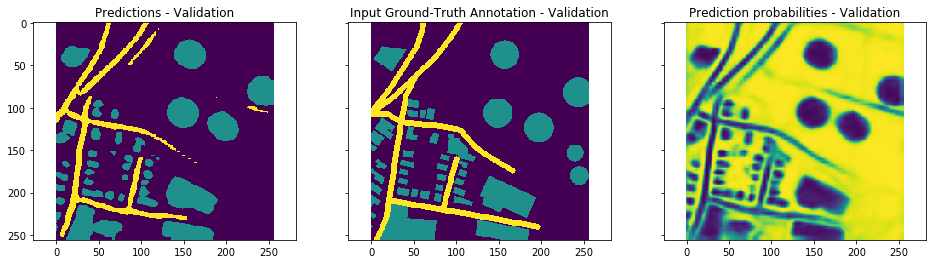

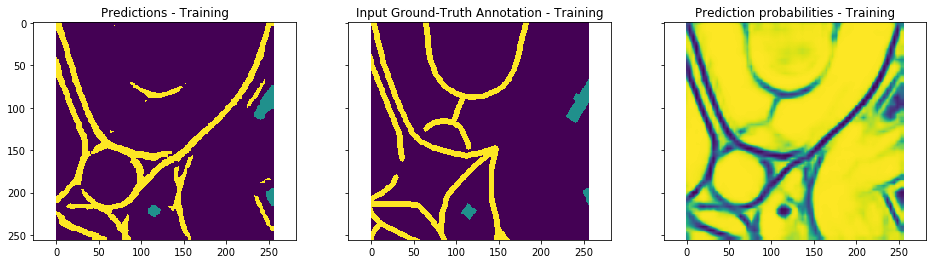

Epoch: 180 	Global step: 18824 	Training loss: 0.22429 	Validation Loss: 0.284869 	mIOU: 0.598927 	Learning rate: 0.0641639


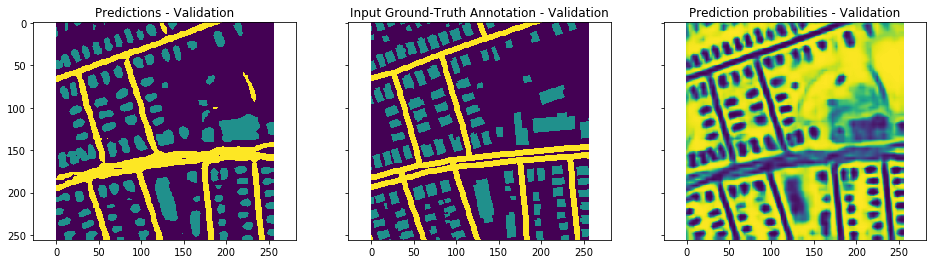

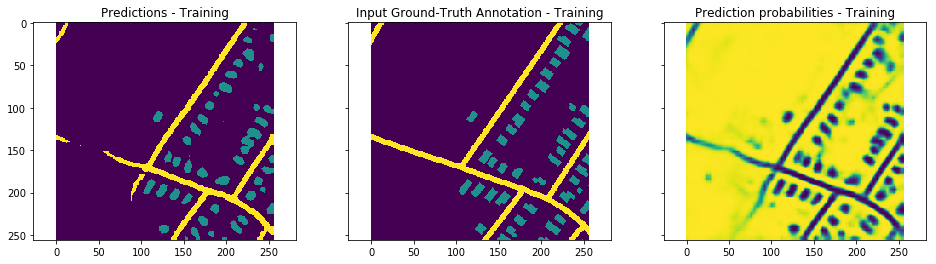

Epoch: 190 	Global step: 19864 	Training loss: 0.105194 	Validation Loss: 0.198729 	mIOU: 0.602864 	Learning rate: 0.0621839


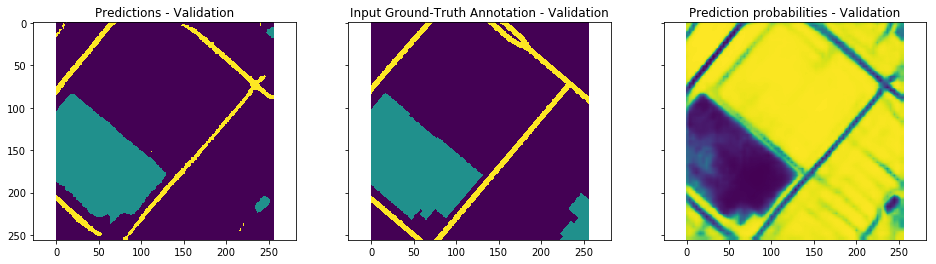

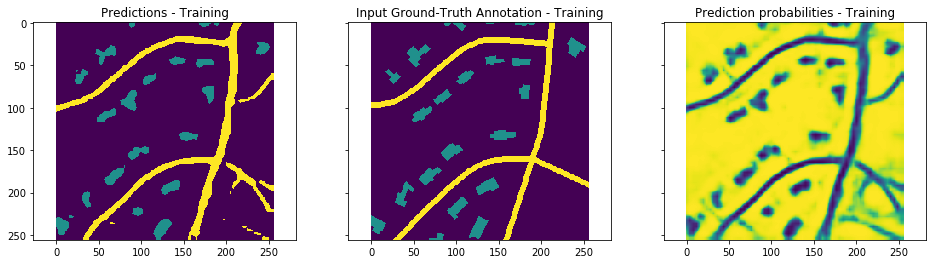

Epoch: 200 	Global step: 20904 	Training loss: 0.102694 	Validation Loss: 0.315723 	mIOU: 0.606621 	Learning rate: 0.0602039


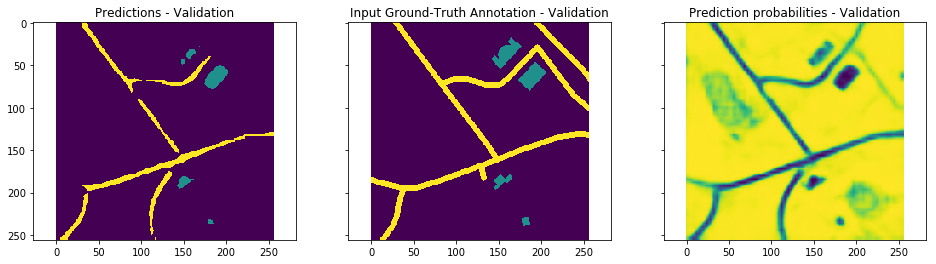

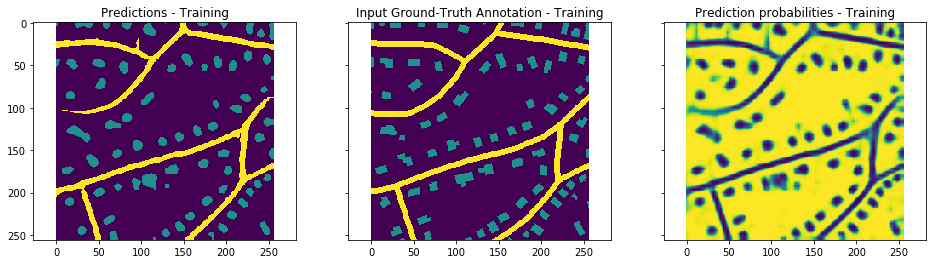

Epoch: 210 	Global step: 21944 	Training loss: 0.240248 	Validation Loss: 0.240265 	mIOU: 0.608158 	Learning rate: 0.0582239


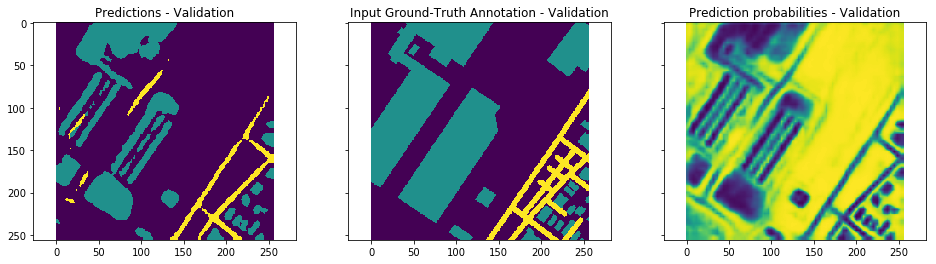

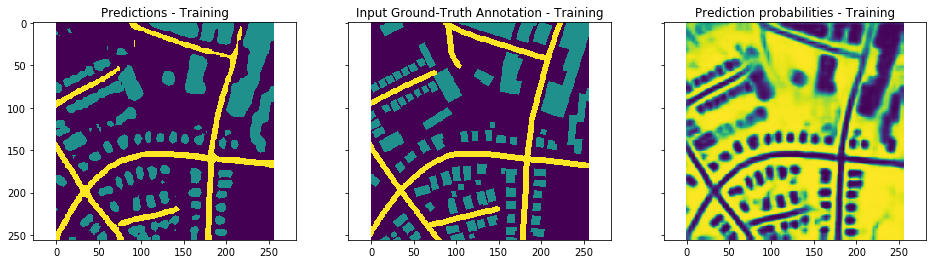

Epoch: 220 	Global step: 22984 	Training loss: 0.273201 	Validation Loss: 0.241065 	mIOU: 0.610855 	Learning rate: 0.0562439


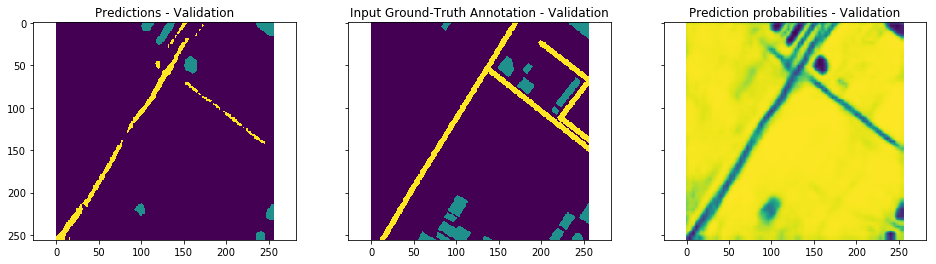

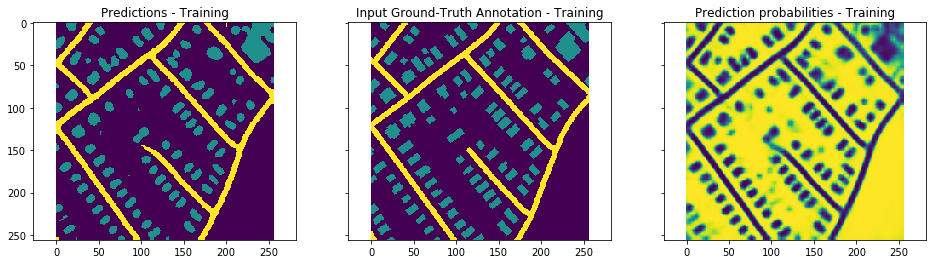

Epoch: 230 	Global step: 24024 	Training loss: 0.212742 	Validation Loss: 0.305238 	mIOU: 0.612692 	Learning rate: 0.0542639


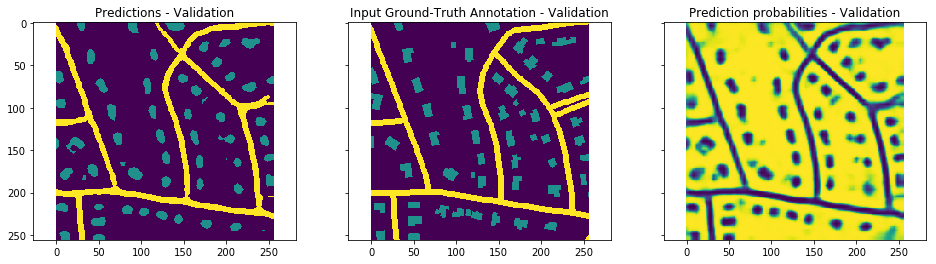

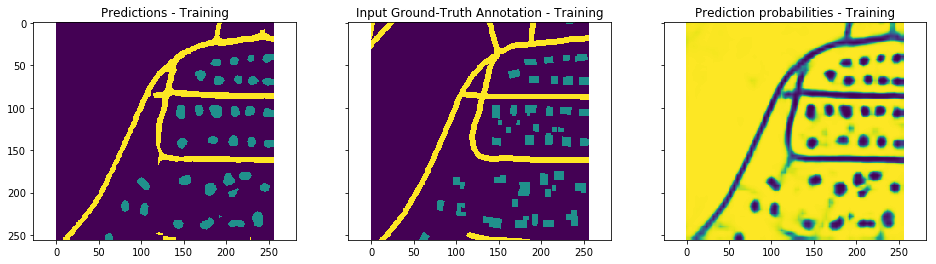

Epoch: 240 	Global step: 25064 	Training loss: 0.251066 	Validation Loss: 0.222223 	mIOU: 0.615274 	Learning rate: 0.0522839


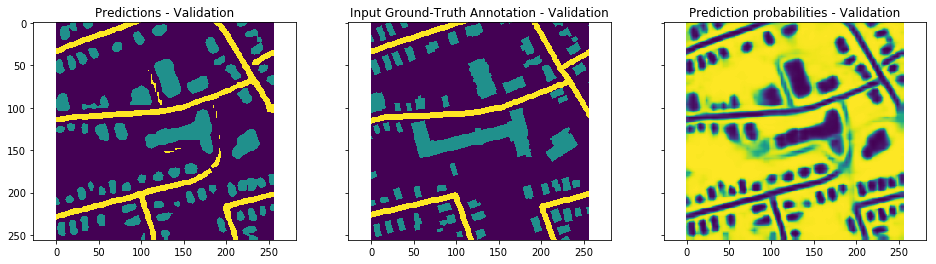

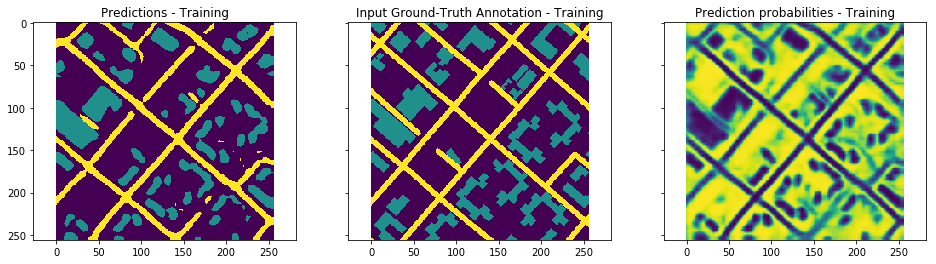

Epoch: 250 	Global step: 26104 	Training loss: 0.337843 	Validation Loss: 0.239598 	mIOU: 0.618004 	Learning rate: 0.0503039


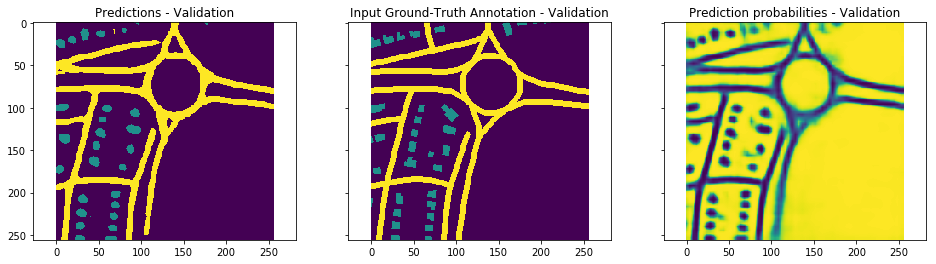

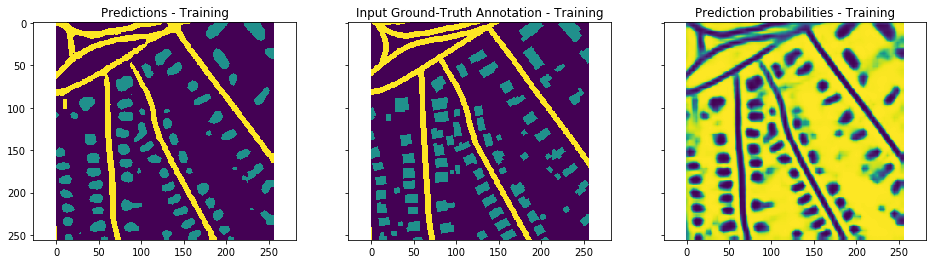

Epoch: 260 	Global step: 27144 	Training loss: 0.204019 	Validation Loss: 0.284793 	mIOU: 0.620177 	Learning rate: 0.0483239


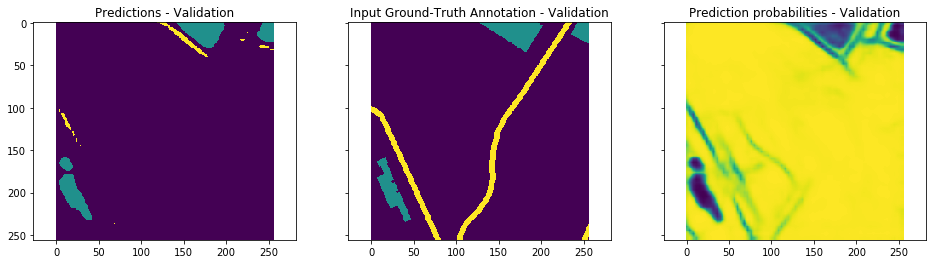

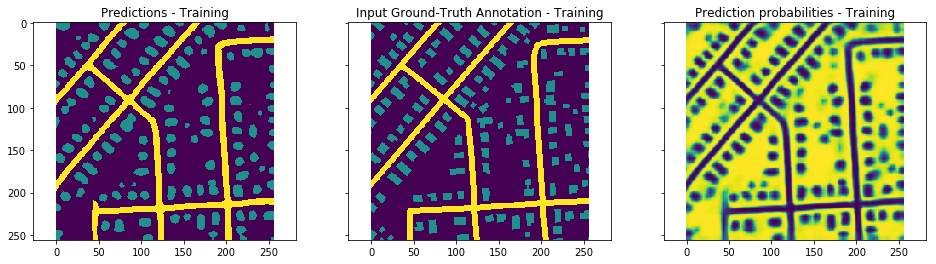

Epoch: 270 	Global step: 28184 	Training loss: 0.246723 	Validation Loss: 0.276845 	mIOU: 0.622079 	Learning rate: 0.0463439


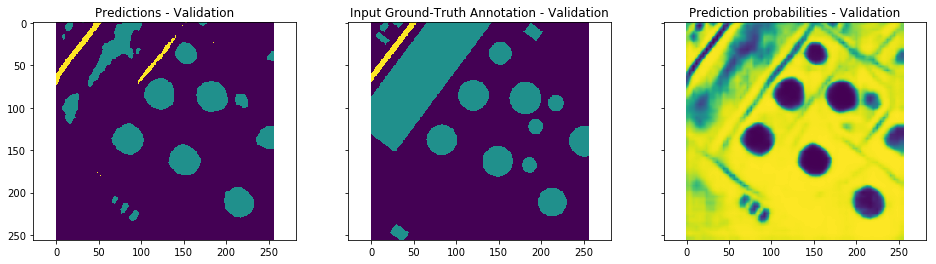

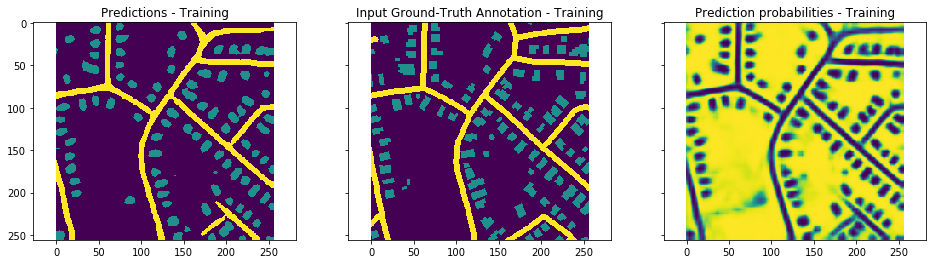

Epoch: 280 	Global step: 29224 	Training loss: 0.27522 	Validation Loss: 0.176676 	mIOU: 0.624093 	Learning rate: 0.0443639


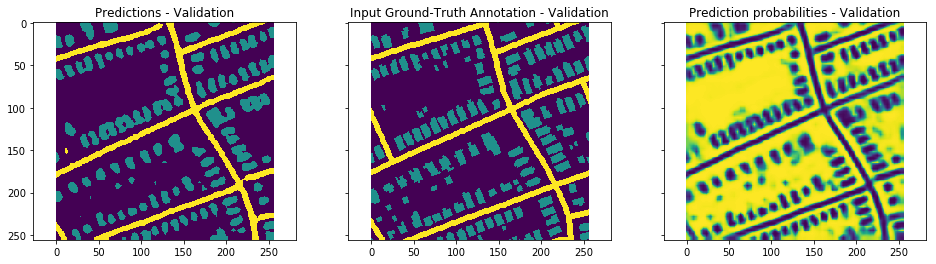

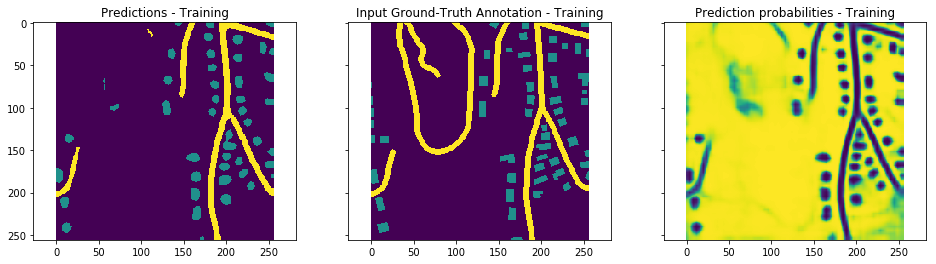

Epoch: 290 	Global step: 30264 	Training loss: 0.304198 	Validation Loss: 0.405561 	mIOU: 0.625059 	Learning rate: 0.0423839


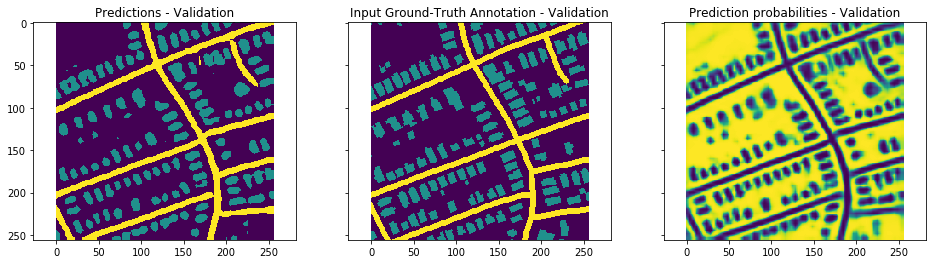

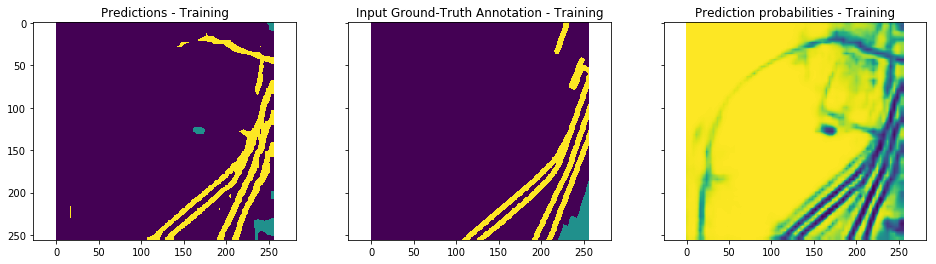

Epoch: 300 	Global step: 31304 	Training loss: 0.298771 	Validation Loss: 0.29969 	mIOU: 0.626185 	Learning rate: 0.0404039


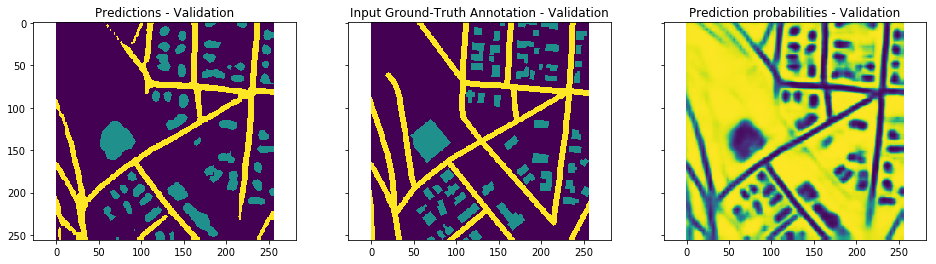

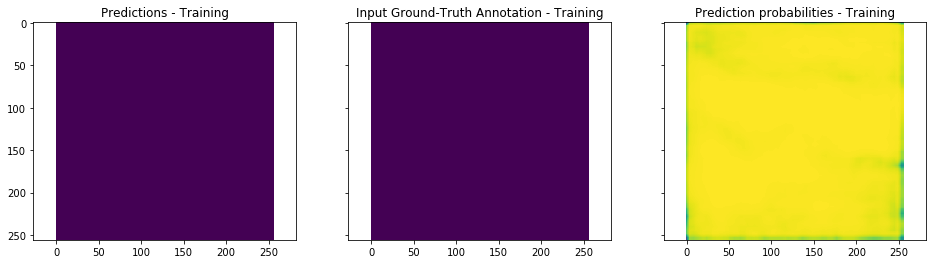

Epoch: 310 	Global step: 32344 	Training loss: 0.064298 	Validation Loss: 0.322759 	mIOU: 0.627115 	Learning rate: 0.0384239


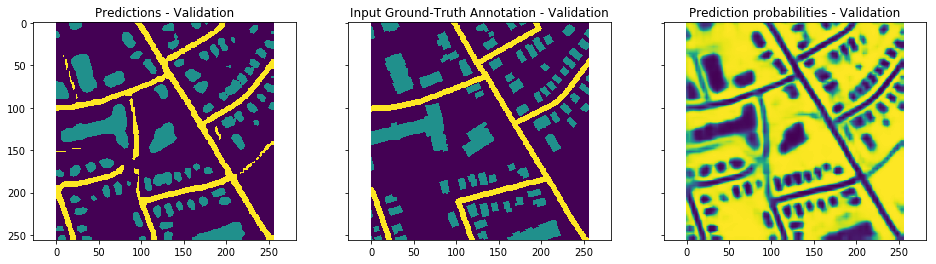

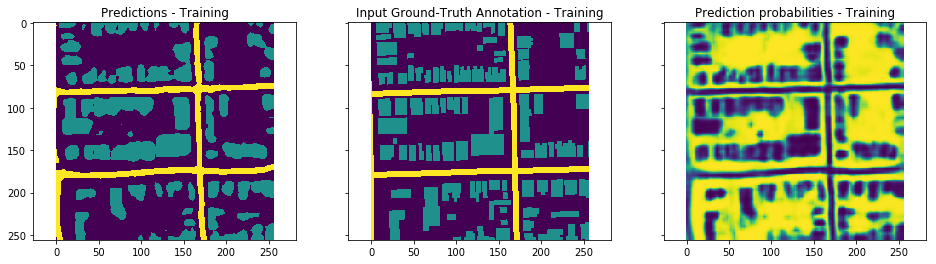

Epoch: 320 	Global step: 33384 	Training loss: 0.366945 	Validation Loss: 0.276958 	mIOU: 0.627831 	Learning rate: 0.0364439


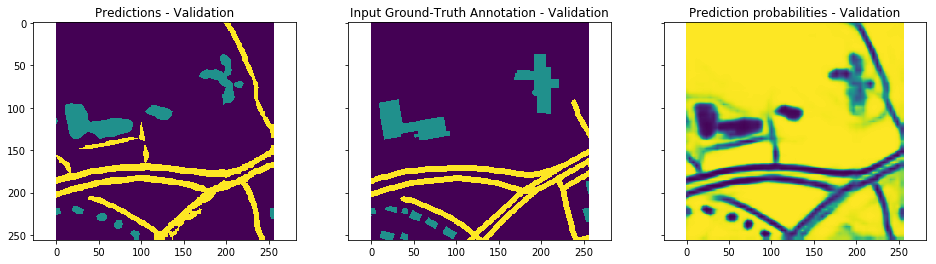

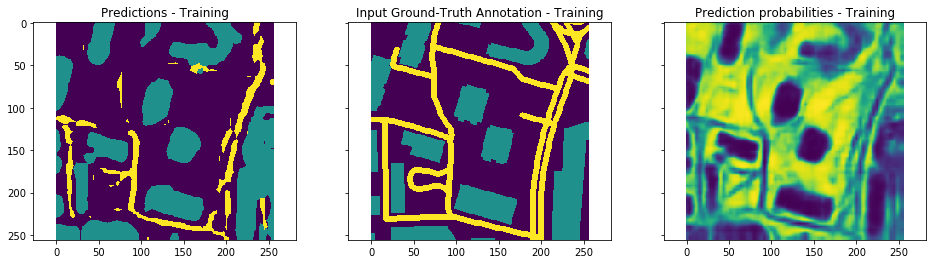

Epoch: 330 	Global step: 34424 	Training loss: 0.361756 	Validation Loss: 0.296077 	mIOU: 0.629744 	Learning rate: 0.0344639


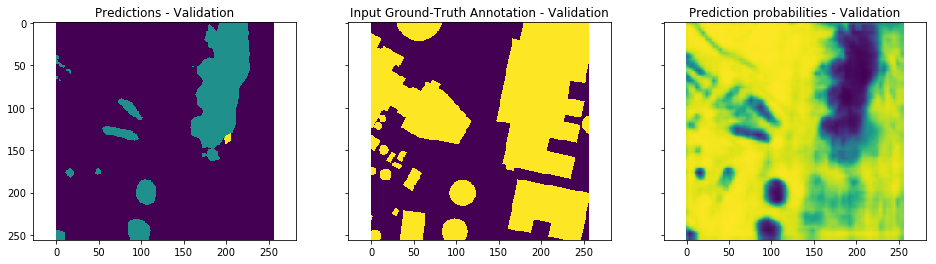

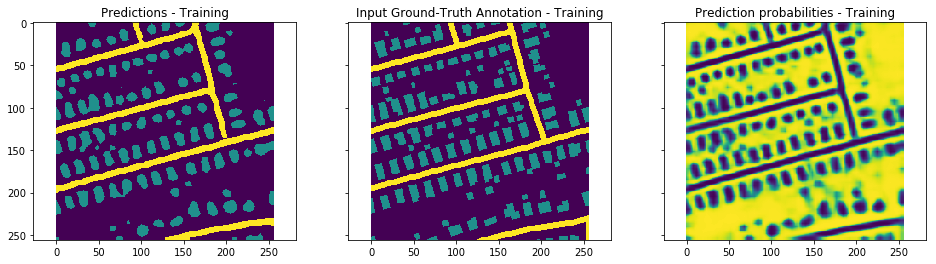

Epoch: 340 	Global step: 35464 	Training loss: 0.266683 	Validation Loss: 0.239083 	mIOU: 0.630573 	Learning rate: 0.0324839


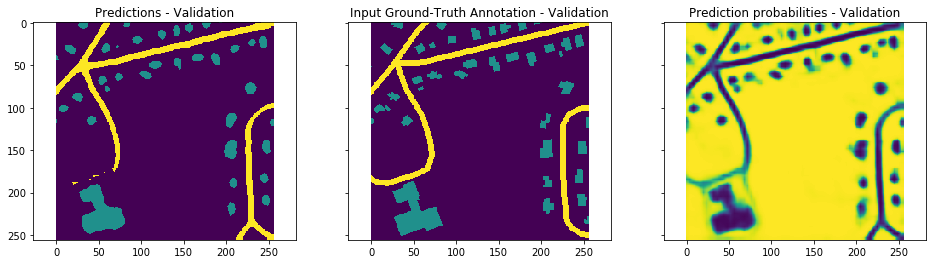

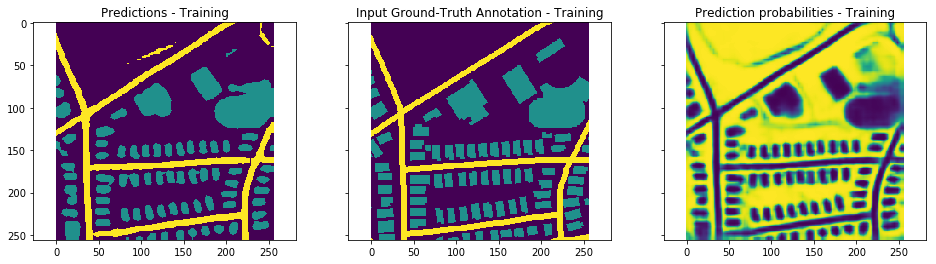

Epoch: 350 	Global step: 36504 	Training loss: 0.311849 	Validation Loss: 0.32485 	mIOU: 0.632658 	Learning rate: 0.0305039


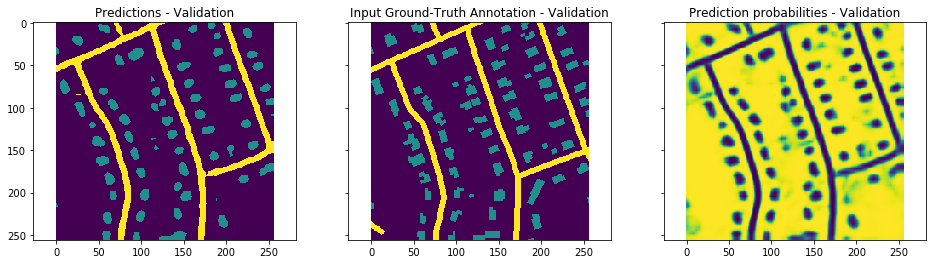

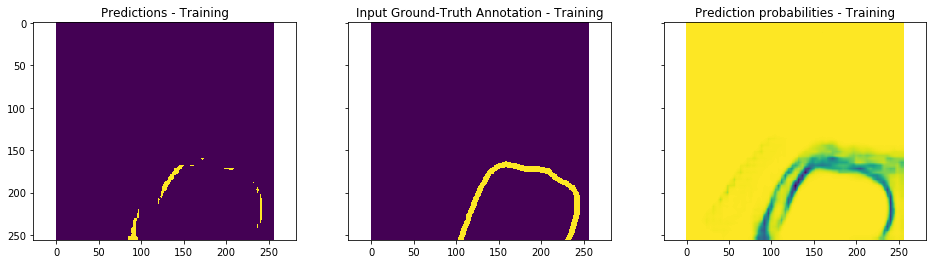

Epoch: 360 	Global step: 37544 	Training loss: 0.122967 	Validation Loss: 0.24789 	mIOU: 0.633262 	Learning rate: 0.0285239


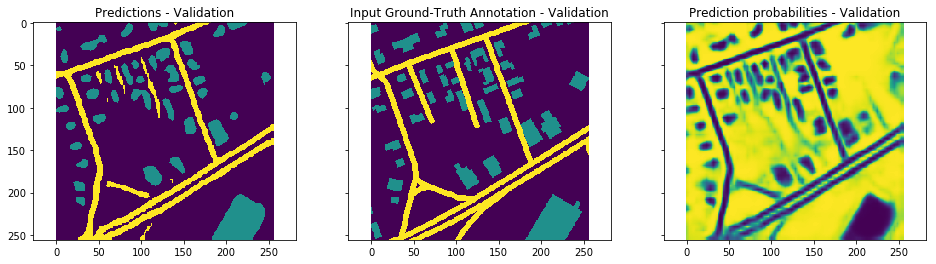

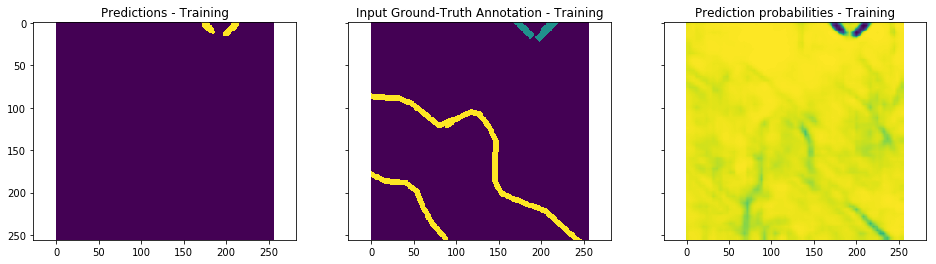

Epoch: 370 	Global step: 38584 	Training loss: 0.19276 	Validation Loss: 0.272672 	mIOU: 0.635141 	Learning rate: 0.0265439


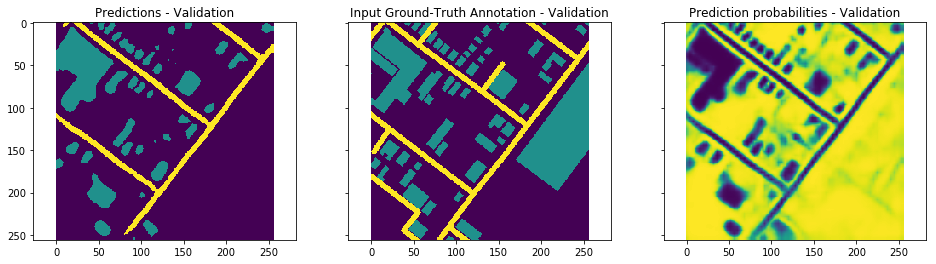

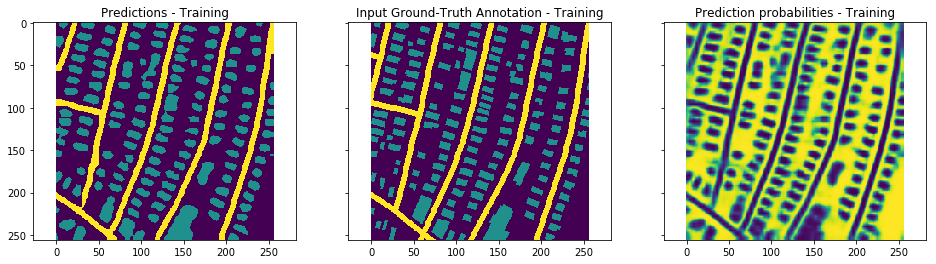

Epoch: 380 	Global step: 39624 	Training loss: 0.209243 	Validation Loss: 0.22932 	mIOU: 0.636365 	Learning rate: 0.0245639


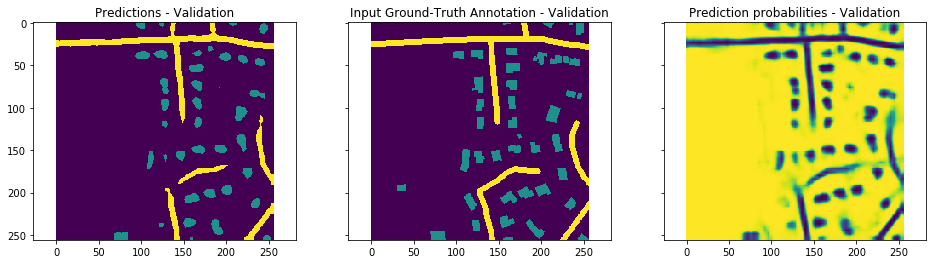

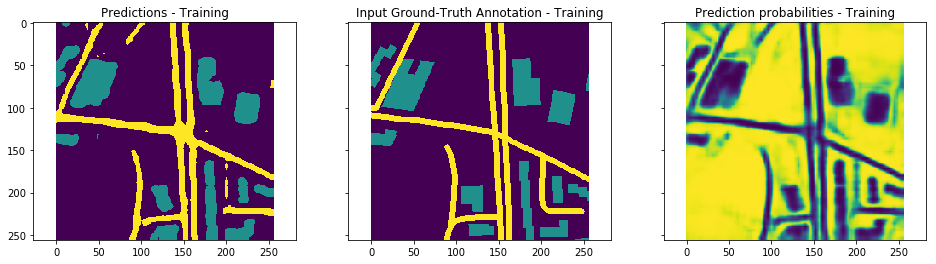

Epoch: 390 	Global step: 40664 	Training loss: 0.276058 	Validation Loss: 0.26861 	mIOU: 0.63759 	Learning rate: 0.0225839


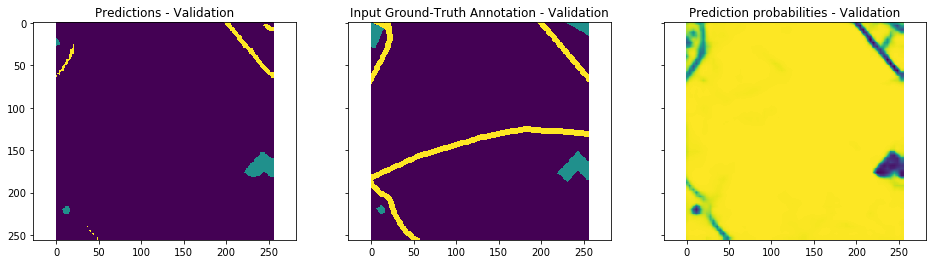

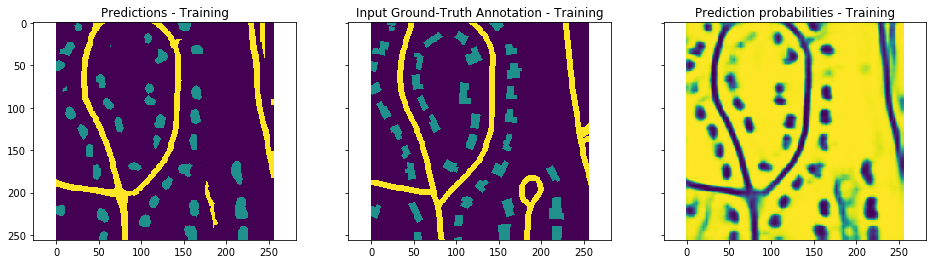

Epoch: 400 	Global step: 41704 	Training loss: 0.147954 	Validation Loss: 0.314575 	mIOU: 0.637829 	Learning rate: 0.0206039


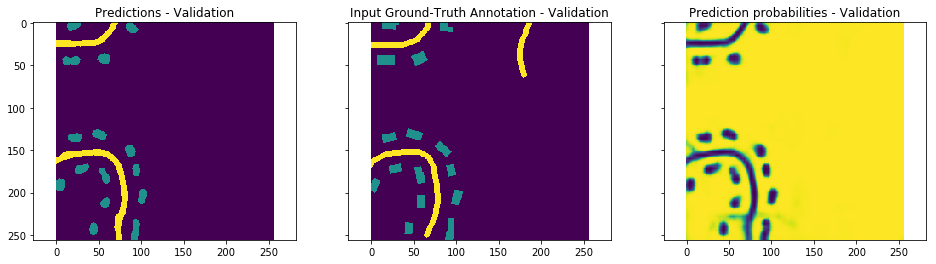

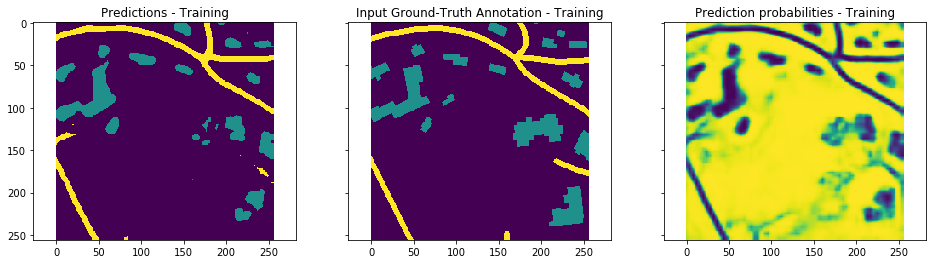

Epoch: 410 	Global step: 42744 	Training loss: 0.196407 	Validation Loss: 0.245774 	mIOU: 0.639434 	Learning rate: 0.0186239


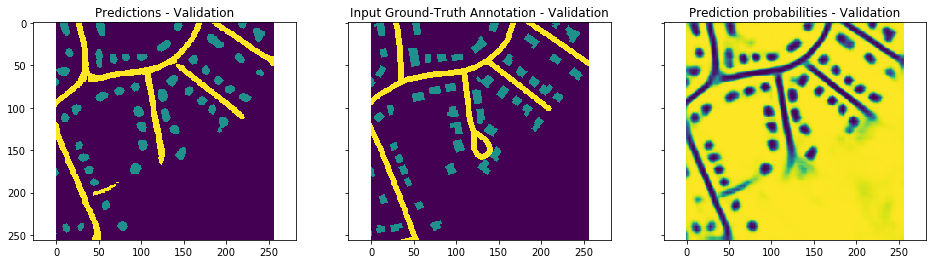

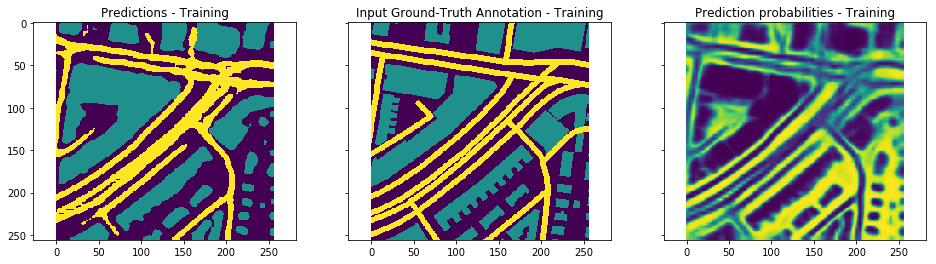

Epoch: 420 	Global step: 43784 	Training loss: 0.282207 	Validation Loss: 0.213678 	mIOU: 0.641226 	Learning rate: 0.0166439


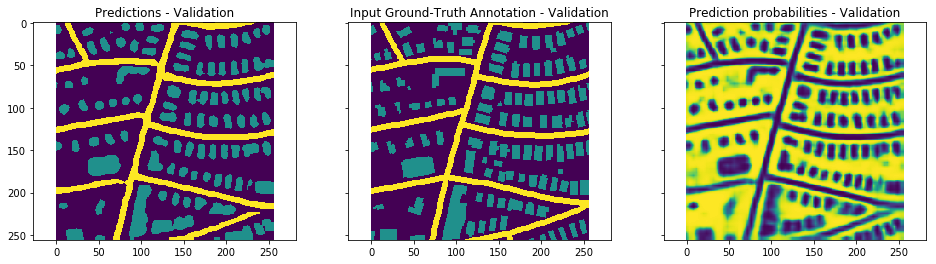

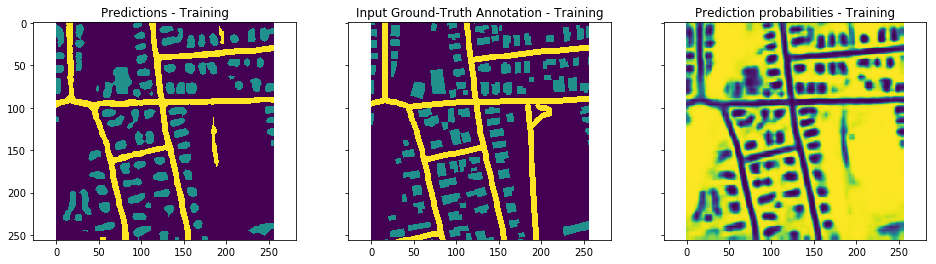

Epoch: 430 	Global step: 44824 	Training loss: 0.246229 	Validation Loss: 0.353345 	mIOU: 0.642267 	Learning rate: 0.0146639


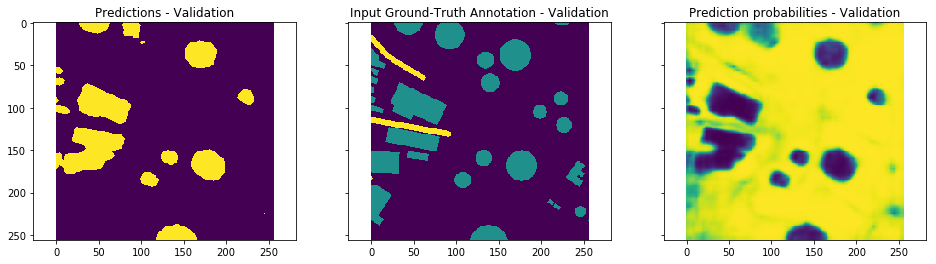

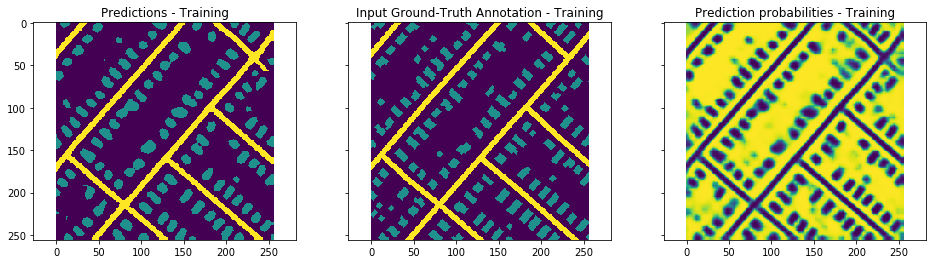

Epoch: 440 	Global step: 45864 	Training loss: 0.229071 	Validation Loss: 0.271581 	mIOU: 0.643081 	Learning rate: 0.0126839


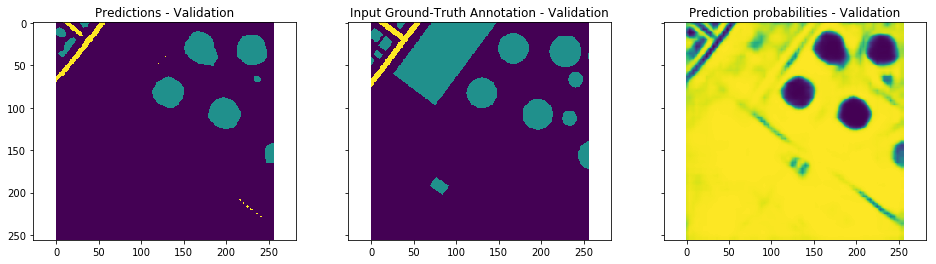

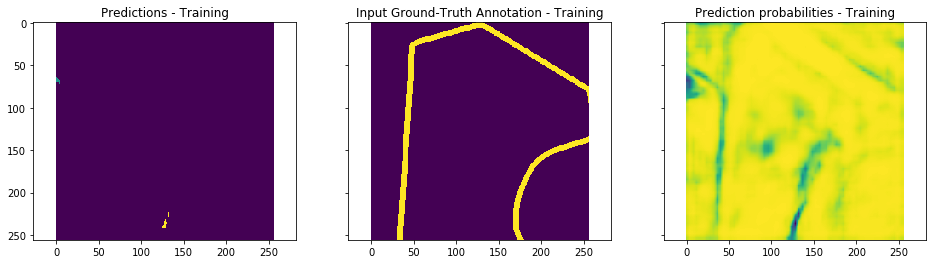

Epoch: 450 	Global step: 46904 	Training loss: 0.27168 	Validation Loss: 0.193941 	mIOU: 0.644102 	Learning rate: 0.0107039


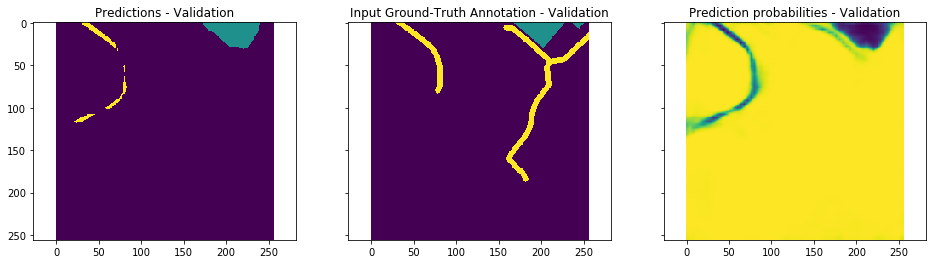

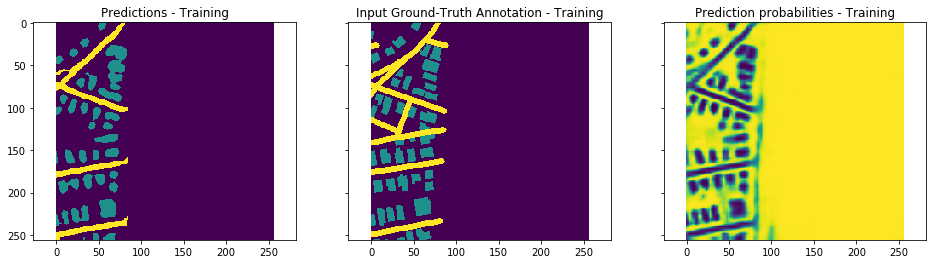

Epoch: 460 	Global step: 47944 	Training loss: 0.179265 	Validation Loss: 0.235984 	mIOU: 0.644831 	Learning rate: 0.0087239


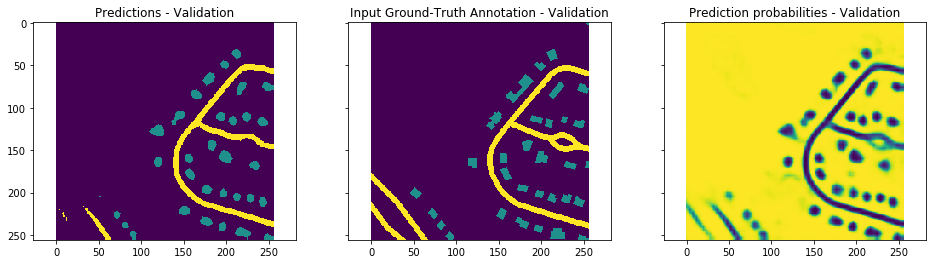

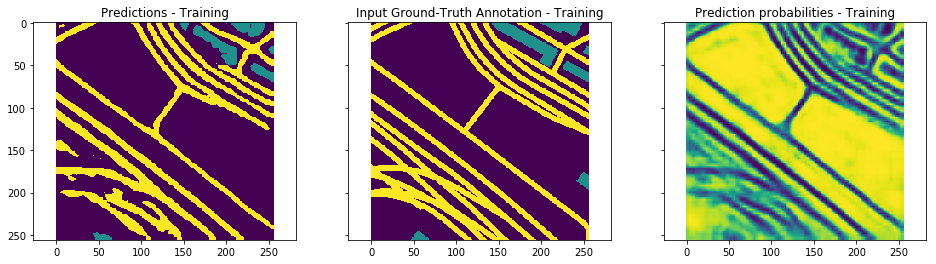

Epoch: 470 	Global step: 48984 	Training loss: 0.265046 	Validation Loss: 0.243344 	mIOU: 0.645422 	Learning rate: 0.0067439


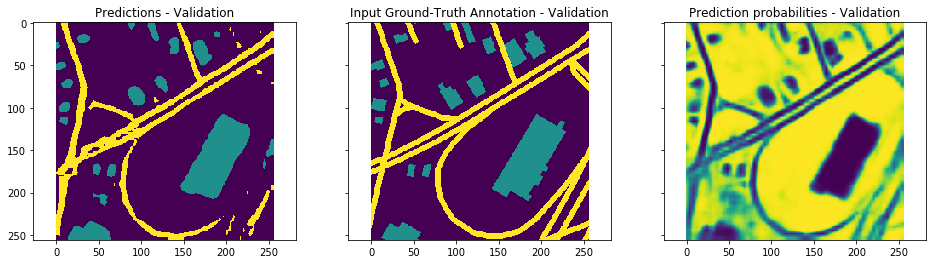

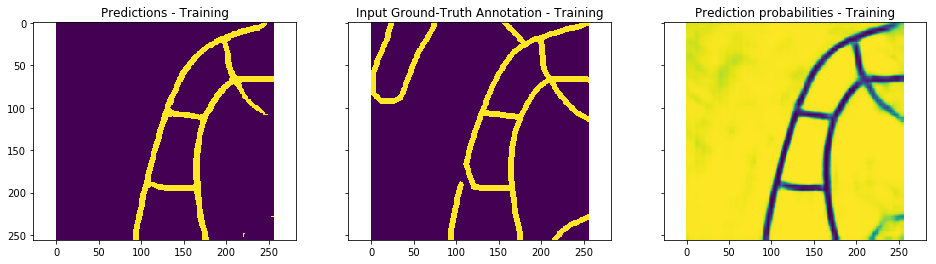

Epoch: 480 	Global step: 50024 	Training loss: 0.248908 	Validation Loss: 0.2551 	mIOU: 0.646431 	Learning rate: 0.0047639


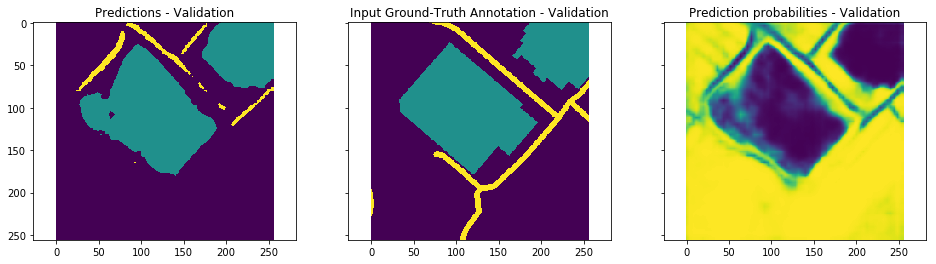

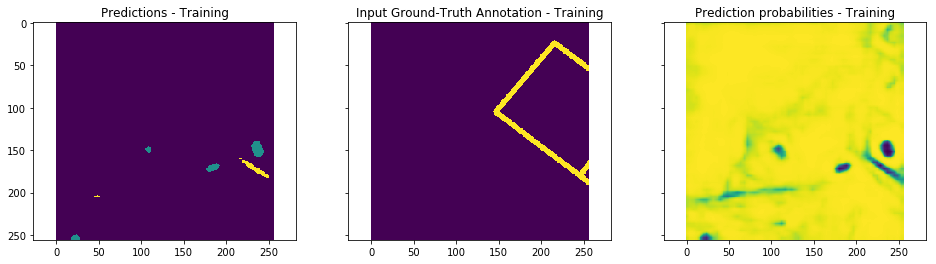

Epoch: 490 	Global step: 51064 	Training loss: 0.198749 	Validation Loss: 0.358262 	mIOU: 0.646749 	Learning rate: 0.00278391


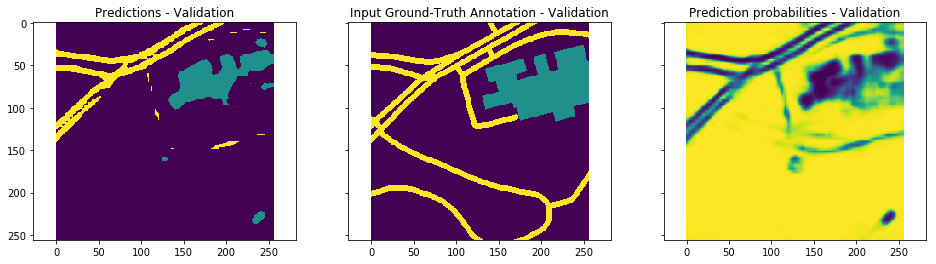

In [27]:
total_training_loss = []
total_validation_loss = []
saver = tf.train.Saver()

with tf.Session() as sess:
    # Create the summary writer -- to write all the logs
    # into a specified file. This file can be later read
    # by tensorboard.
    train_writer = tf.summary.FileWriter(log_folder + "/train", sess.graph)
    test_writer = tf.summary.FileWriter(log_folder + '/test')
    
    # Create a saver.
    sess.run(tf.local_variables_initializer())
    sess.run(tf.global_variables_initializer())
    
    for epoch in range(500):

        for batch_image, batch_annotations in next_batch(train_images_dir, train_annotations_dir, images_filename_list, 
                                                         crop_image=True, batch_size=16, crop_size=256):
            # print(epoch, batch_image.shape)
            _, global_step_np, train_loss, pred_np, probabilities_np, summary_string, lr_np = sess.run([train_step, global_step, cross_entropy, pred, 
                                                                                 probabilities, merged_summary_op, learning_rate],
                                                        feed_dict={is_training_placeholder: True,
                                                                  batch_images_placeholder:batch_image,
                                                                  batch_labels_placeholder:batch_annotations,
                                                                  keep_prob: 1.0})
            train_writer.add_summary(summary_string, global_step_np)

        if epoch % 10 == 0:
            cmap = plt.get_cmap('bwr')
            f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
            f.set_figheight(4)
            f.set_figwidth(16)

            ax1.imshow(pred_np[0])
            ax1.set_title('Predictions - Training')
            probability_graph = ax2.imshow(batch_annotations[0])
            ax2.set_title('Input Ground-Truth Annotation - Training')
            probability_graph = ax3.imshow(probabilities_np[0].squeeze()[:, :, 0])
            ax3.set_title('Prediction probabilities - Training')
            plt.show()
            
            total_miou_np = []
            total_val_loss = []
            for batch_images_val, batch_annotations_val in next_batch(val_images_dir, val_annotations_dir, val_images_filename_list, 
                                                             crop_image=True, batch_size=4, crop_size=256):

                val_loss, pred_np, probabilities_np, summary_string, _ = sess.run([cross_entropy, pred, probabilities, merged_summary_op, update_op],
                                                                    feed_dict={is_training_placeholder: False,
                                                                              batch_images_placeholder:batch_images_val,
                                                                              batch_labels_placeholder:batch_annotations_val,
                                                                              keep_prob: 1.0})

                miou_np = sess.run(miou)
                total_val_loss.append(val_loss)
                total_miou_np.append(miou_np) 
            
            print("Epoch:", epoch, "\tGlobal step:", global_step_np, "\tTraining loss:", train_loss, "\tValidation Loss:", 
                  np.mean(total_val_loss), "\tmIOU:", np.mean(total_miou_np), "\tLearning rate:", lr_np)

            total_training_loss.append(train_loss)
            total_validation_loss.append(np.mean(total_val_loss))
            
            test_writer.add_summary(summary_string, global_step_np)
            
            cmap = plt.get_cmap('bwr')
            f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
            f.set_figheight(4)
            f.set_figwidth(16)

            ax1.imshow(pred_np[0])
            ax1.set_title('Predictions - Validation')
            probability_graph = ax2.imshow(batch_annotations_val[0])
            ax2.set_title('Input Ground-Truth Annotation - Validation')
            probability_graph = ax3.imshow(probabilities_np[0].squeeze()[:, :, 0])
            ax3.set_title('Prediction probabilities - Validation')
            plt.show()
            
            # Save the variables to disk.
            save_path = saver.save(sess, "/tmp/model_" + version + ".ckpt")
            
        # at the end epoch shuffle the dataset list files
        np.random.shuffle(images_filename_list)
        np.random.shuffle(val_images_filename_list)

    train_writer.close()